##Course Project
We would like to forecast the number of marriages, the number of divorces and the number of births in a city or a country.
Make all necessary steps, plots, tests, predictions and comparison. Use Python and submit one file "CP-YourFirst-and-LastName.ipynb".

1. Gather data for the number of marriages, the number of divorces and the number of births in a city or a country during a period that you consider sufficient for forecasting.
2. Visualise the time series. Use time series decomposition to extract the trend and seasonal components. Divide the data into train and test sets.
3. Fit a SARIMA model.
4. Could you think of external variables that have impact on any of the three series? Fit a SARIMAX model.
5. Is there inter-dependance between any of these three time series? If not, try to find another time series that is inter-dependant with the number of births, for example. Fit a VARMAX model.
6.Choose and apply two baseline models.
7. Make forecasts and plot them.
8. Compare the performance of the developed models: baselines, SARIMA, SARIMAX and VARMAX. Select an appropriate error metric.
9. Make conclusions.
10. Submit your work.

##1.Gather data for the number of marriages, the number of divorces and the number of births in a city or a country during a period that you consider sufficient for forecasting.

##I will be working with US data.
##Period: I will analyze the maximum period that was provided by US statistics: 2003-May 2024

#1. **Preparing fertility data. All data was taken from the official US CDC website**

##**Fertility for the period 2003 - May 2006**

In [1]:
import pandas as pd


data = {
    "Month": [
        "January", "January", "January", "January",
        "February", "February", "February", "February",
        "March", "March", "March", "March",
        "April", "April", "April", "April",
        "May", "May", "May", "May",
        "June", "June", "June", "June",
        "July", "July", "July", "July",
        "August", "August", "August", "August",
        "September", "September", "September", "September",
        "October", "October", "October", "October",
        "November", "November", "November", "November",
        "December", "December", "December", "December"
    ],
    "Year": [
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006,
        2003, 2004, 2005, 2006
    ],
    "Births": [
        329803, 332907, 331478, 340297,
        307248, 315821, 309620, 319235,
        336920, 346348, 349321, 356786,
        330106, 333335, 332477, 329809,
        346754, 337651, 346276, 355437,
        337425, 344881, 350879, 358251,
        364226, 359426, 357053, 367934,
        360103, 355408, 369316, 387798,
        359644, 356033, 363369, 374711,
        354048, 348466, 344639, 367354,
        320094, 335704, 335667, 351832,
        343579, 346072, 348254, 356111
    ]
}


df_1 = pd.DataFrame(data)

#создаю столбец Date с датой по месяцу и году в формате datetime Для дальнейшего корректного анализа
df_1['Date'] = pd.to_datetime(df_1['Month'] + " " + df_1['Year'].astype(str)).astype(str)
df_1 = df_1[['Date', 'Births']]
df_1.reset_index(drop=True, inplace=True)

#сортирую датасет по дате
df_1 = df_1.sort_values(by='Date')
print(df_1)

          Date  Births
0   2003-01-01  329803
4   2003-02-01  307248
8   2003-03-01  336920
12  2003-04-01  330106
16  2003-05-01  346754
20  2003-06-01  337425
24  2003-07-01  364226
28  2003-08-01  360103
32  2003-09-01  359644
36  2003-10-01  354048
40  2003-11-01  320094
44  2003-12-01  343579
1   2004-01-01  332907
5   2004-02-01  315821
9   2004-03-01  346348
13  2004-04-01  333335
17  2004-05-01  337651
21  2004-06-01  344881
25  2004-07-01  359426
29  2004-08-01  355408
33  2004-09-01  356033
37  2004-10-01  348466
41  2004-11-01  335704
45  2004-12-01  346072
2   2005-01-01  331478
6   2005-02-01  309620
10  2005-03-01  349321
14  2005-04-01  332477
18  2005-05-01  346276
22  2005-06-01  350879
26  2005-07-01  357053
30  2005-08-01  369316
34  2005-09-01  363369
38  2005-10-01  344639
42  2005-11-01  335667
46  2005-12-01  348254
3   2006-01-01  340297
7   2006-02-01  319235
11  2006-03-01  356786
15  2006-04-01  329809
19  2006-05-01  355437
23  2006-06-01  358251
27  2006-07

<ipython-input-1-1def68a1da6b>:53: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_1['Date'] = pd.to_datetime(df_1['Month'] + " " + df_1['Year'].astype(str)).astype(str)


##**Fertility for the period 2007 - May 2022**

In [2]:
import pandas as pd

data_2007 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2007] * 13,
    "Births": [
        354943, 326891, 360828, 338224, 362319, 358606, 379616, 390378,
        366904, 369324, 353660, 354540, 4316233
    ]
}

data_2008 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2008] * 13,
    "Births": [
        356457, 338521, 350630, 346397, 354886, 348587, 375384, 373333,
        367965, 357875, 323788, 353871, 4247694
    ]
}

data_2009 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2009] * 13,
    "Births": [
        337980, 316641, 347803, 337272, 345257, 346971, 368450, 359554,
        361922, 347625, 320195, 340995, 4130665
    ]
}

data_2010 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2010] * 13,
    "Births": [
        323249, 301994, 338613, 325028, 328273, 334535, 345199, 349747,
        350745, 336809, 326220, 338974, 3999386
    ]
}

data_2011 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2011] * 13,
    "Births": [
        320477, 297961, 330151, 313275, 326647, 337280, 345560, 359404,
        345548, 328488, 321479, 327320, 3953590
    ]
}

data_2012 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2012] * 13,
    "Births": [
        316315, 304505, 324322, 306700, 330146, 327189, 347542, 361114,
        340113, 345497, 325146, 324252, 3952841
    ]
}

data_2013 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2013] * 13,
    "Births": [
        323691, 291748, 320529, 311645, 329520, 319779, 349158, 353485,
        338008, 340562, 318482, 335574, 3932181
    ]
}

data_2014 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2014] * 13,
    "Births": [
        326366, 298404, 323572, 318990, 334613, 325981, 355524, 354257,
        348424, 343356, 317998, 340591, 3988076
    ]
}

data_2015 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2015] *13,
    "Births": [
        325955, 298058, 328923, 320832, 327917, 330541, 353415, 351791,
        347516, 339007, 318820, 335722, 3978497
    ]
}

data_2016 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2016] * 13,
    "Births": [
        316707, 306015, 328526, 313485, 327631, 332324, 342728, 357830,
        345552, 330958, 319389, 324730, 3945875
    ]
}

data_2017 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2017] * 13,
    "Births": [
        313786, 289054, 319625, 300116, 322456, 323920, 334924, 352151,
        337175, 329869, 316511, 315913, 3855500
    ]
}

data_2018 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2018] * 13,
    "Births": [
        314808, 284250, 316044, 298394, 320622, 314816, 329009, 344750,
        322772, 326778, 308703, 310766, 3791712
    ]
}

data_2019 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2019] * 13,
    "Births": [
        310872, 279963, 304237, 298947, 316386, 304092, 333646, 341685,
        325781, 325043, 298086, 308802, 3747540
    ]
}

data_2020 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2020] * 13,
    "Births": [
        304722, 282654, 301625, 290478, 301481, 302164, 321637, 319621,
        311705, 305085, 282597, 289878, 3613647
    ]
}

data_2021 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2021] * 13,
    "Births": [
        277172, 266355, 302692, 293208, 300912, 313597, 326117, 330271,
        325738, 315414, 301730, 311086, 3667758
    ]
}

data_2022 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Year": [2022] * 13,
    "Births": [
        294843, 275727, 307459, 288660, 297576, 305759, 320822, 335912,
        312233, 306805, 307148, 314814, 3667758
    ]
}
all_data = [
    data_2007, data_2008, data_2009, data_2010, data_2011, data_2012,
    data_2013, data_2014, data_2015, data_2016, data_2017, data_2018,
    data_2019, data_2020, data_2021, data_2022
]


df_2 = pd.concat([pd.DataFrame(data) for data in all_data], ignore_index=True)


df_2 = df_2[df_2['Month'] != 'Total']

df_2['Date'] = pd.to_datetime(df_2['Month'] + " " + df_2['Year'].astype(str)).astype(str)

df_2 = df_2[['Date', 'Births']]
df_2.reset_index(drop=True, inplace=True)
df_2 = df_2.sort_values(by='Date')
print(df_2)

           Date  Births
0    2007-01-01  354943
1    2007-02-01  326891
2    2007-03-01  360828
3    2007-04-01  338224
4    2007-05-01  362319
..          ...     ...
187  2022-08-01  335912
188  2022-09-01  312233
189  2022-10-01  306805
190  2022-11-01  307148
191  2022-12-01  314814

[192 rows x 2 columns]


<ipython-input-2-613828027b51>:206: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_2['Date'] = pd.to_datetime(df_2['Month'] + " " + df_2['Year'].astype(str)).astype(str)


##**Fertility for the period 2023 - May 2024**

In [3]:
import pandas as pd

data_2023 = {
    "Month": [
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December", "Total"
    ],
    "Births": [
        299465, 270844, 299356, 278629, 299543, 303321, 311595, 322359,
        305511, 309117, 298225, 298039, 3596004
    ]
}

data_2024 = {
    "Month": [
        "January", "February", "March", "April", "May", "Total"
    ],
    "Births": [
        296615, 282683, 297313, 288369, 297325, 1462305
    ]
}


df_2023 = pd.DataFrame(data_2023)
df_2024 = pd.DataFrame(data_2024)

# Удаляем строки "Total"
df_2023 = df_2023[df_2023['Month'] != "Total"]
df_2024 = df_2024[df_2024['Month'] != "Total"]

# Создаем столбец 'Date'
df_2023['Date'] = df_2023['Month'] + " 2023"
df_2024['Date'] = df_2024['Month'] + " 2024"

# Выбираем и переименовываем столбцы
df_2023 = df_2023[['Date', 'Births']]
df_2024 = df_2024[['Date', 'Births']]

# Объединяем DataFrame'ы
df_3 = pd.concat([df_2023, df_2024])

# Сбрасываем индекс и отображаем результат
df_3.reset_index(drop=True, inplace=True)
df_3['Date'] = pd.to_datetime(df_3['Date'], format='%B %Y')
df_3 = df_3.sort_values(by='Date')
print(df_3)


         Date  Births
0  2023-01-01  299465
1  2023-02-01  270844
2  2023-03-01  299356
3  2023-04-01  278629
4  2023-05-01  299543
5  2023-06-01  303321
6  2023-07-01  311595
7  2023-08-01  322359
8  2023-09-01  305511
9  2023-10-01  309117
10 2023-11-01  298225
11 2023-12-01  298039
12 2024-01-01  296615
13 2024-02-01  282683
14 2024-03-01  297313
15 2024-04-01  288369
16 2024-05-01  297325


##**Merge all monthly data from 2003 to May 2024 natality data into a single dataset**

In [7]:
df = pd.concat([df_1, df_2, df_3], ignore_index=True)
df

,Date,Births
0,2003-01-01,329803
1,2003-02-01,307248
2,2003-03-01,336920
3,2003-04-01,330106
4,2003-05-01,346754
...,...,...
252,2024-01-01 00:00:00,296615
253,2024-02-01 00:00:00,282683
254,2024-03-01 00:00:00,297313
255,2024-04-01 00:00:00,288369


##**2. I will visualise the time series for natality data. Use time series decomposition to extract the trend and seasonal components. Divide the data into train and test sets.**

In [8]:
df['Date'] = pd.to_datetime(df['Date'])

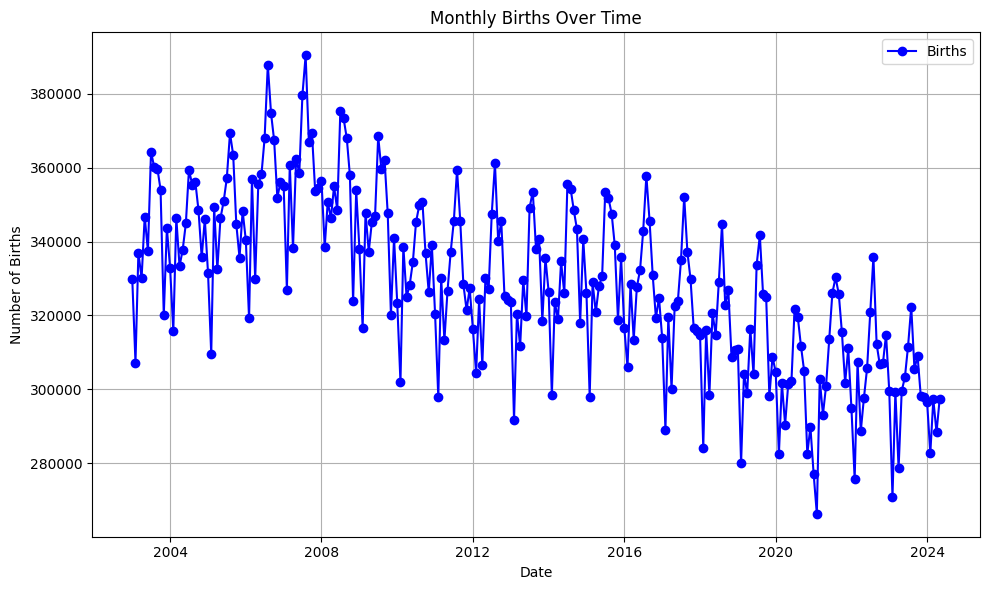

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df['Date'] = pd.to_datetime(df['Date'])


plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(df['Date'], df['Births'], marker='o', linestyle='-', color='b', label='Births')

# Formatting
plt.title('Monthly Births Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Births')
plt.grid(True)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()


##I will build a more convenient and visual chart

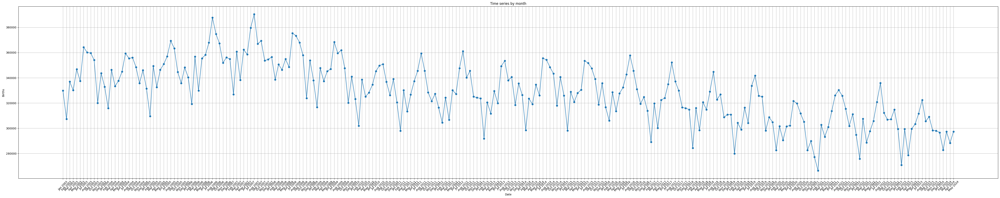

In [ ]:
import matplotlib.dates as mdates

plt.figure(figsize=(50, 10))
plt.plot(df['Date'], df['Births'], marker='o', linestyle='-')
plt.title('Time series by month')
plt.xlabel('Date')
plt.ylabel('Births')


# Formatting the X axis to display months and years
plt.xticks(df['Date'], df['Date'].dt.strftime('%b %Y'), rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
#plt.yticks(df['Births'])
plt.grid(True)
plt.tight_layout()
plt.show()

#**Now we can comfortably view all the data by analyzing the plot**
##Having studied the graph, we see seasonality: that in summer: June, July, August the highest birth rate; And January, March and October have the lowest birth rates. And with the help of SARIMA in further steps I will take this into account.

##I will use time series decomposition to to extract the trend and seasonal components.

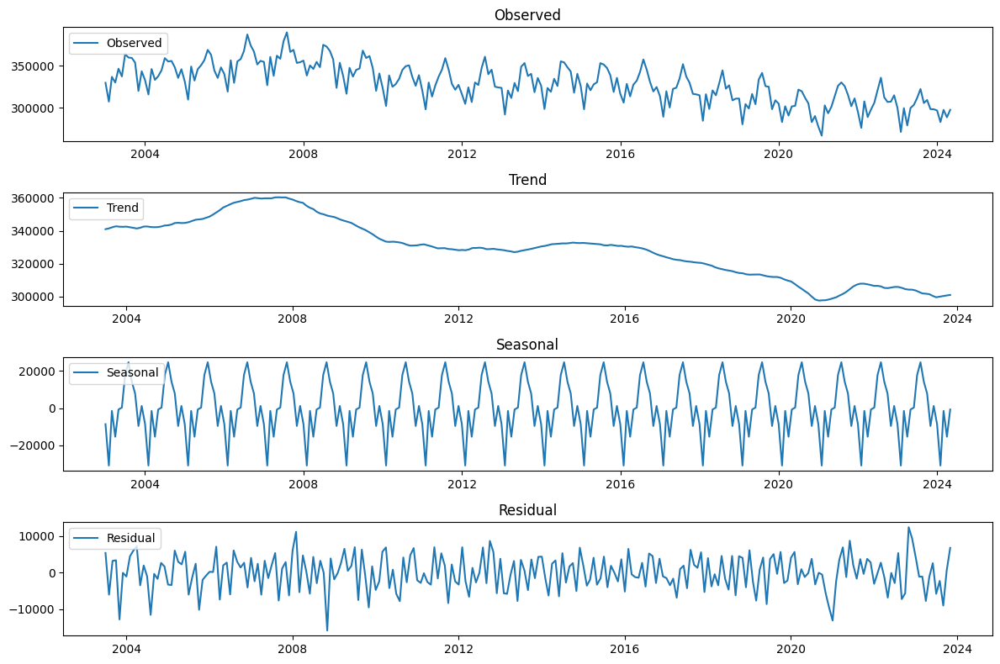

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose


result = seasonal_decompose(df['Births'], model='additive', period=12)  # period=12 indicates annual seasonality

plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(df['Date'], result.observed, label='Observed')
plt.legend(loc='upper left')
plt.title('Observed')

plt.subplot(412)
plt.plot(df['Date'], result.trend, label='Trend')
plt.legend(loc='upper left')
plt.title('Trend')

plt.subplot(413)
plt.plot(df['Date'], result.seasonal, label='Seasonal')
plt.legend(loc='upper left')
plt.title('Seasonal')

plt.subplot(414)
plt.plot(df['Date'], result.resid, label='Residual')
plt.legend(loc='upper left')
plt.title('Residual')

plt.tight_layout()
plt.show()

###And I also will use the STL function from statsmodels:

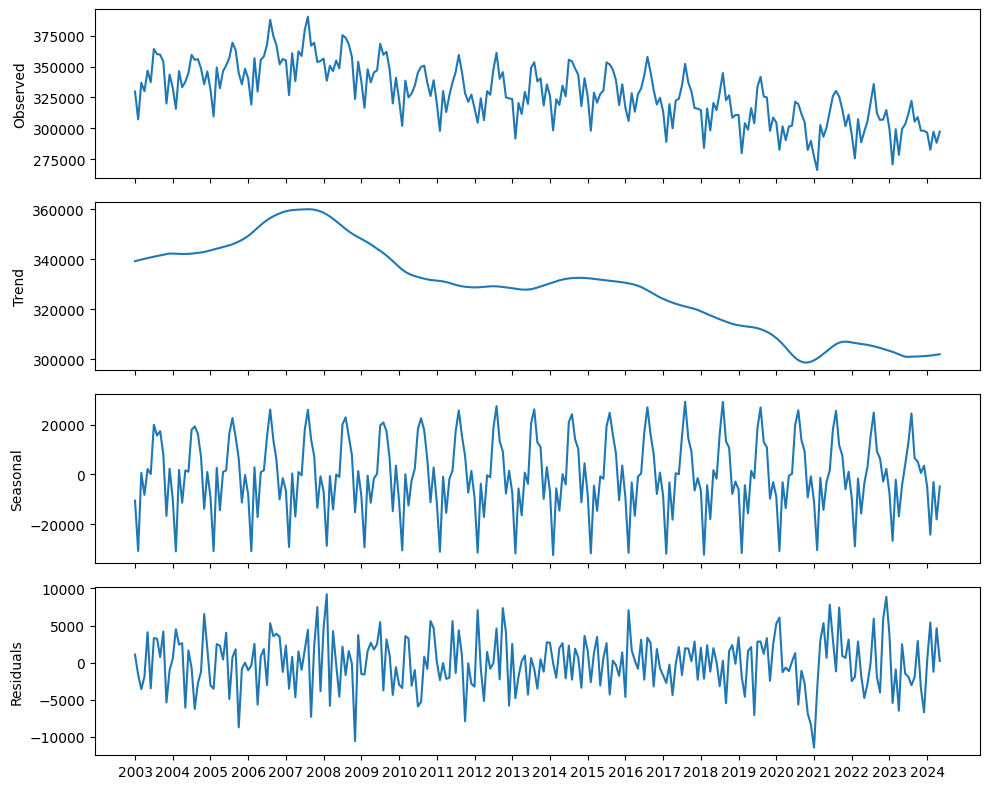

In [ ]:
from statsmodels.tsa.seasonal import STL
import numpy as np


decomposition = STL(df['Births'], period=12).fit()


fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10, 8))

ax1.plot(decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(decomposition.resid)
ax4.set_ylabel('Residuals')

plt.xticks(np.arange(0, len(df), 12), df['Date'].dt.year.unique())

plt.tight_layout()
plt.show()

##1. The trend component shows cyclical changes, initially with slight increases until 2008, followed by a long period of decline.From 2008 to 2024 there is a clear decrease in trend values ​​from approximately 360,000 to 320,000.

##2. Very pronounced seasonality. Seasonal variations occur regularly, indicating that there are recurring factors influencing the data. The amplitude of seasonal fluctuations remains relatively constant throughout the entire period.

##3. The residual components do not show obvious trends or seasonal patterns, which is a good indicator of correct decomposition.

##**I will divide the data into train and test sets.**

In [ ]:
train_size = int(len(df) * 0.8)
train = df['Births'].iloc[:-12]
test = df['Births'].iloc[-12:]

In [ ]:
print(train.shape)
print(test.shape)

(245,)
(12,)


##**3. I will fit a SARIMA model for natality data.**

##**1. I'll check if the data is stationary.**

Run the ADF test and check if the process is stationary. If not, apply differencing.

I will use Augmented Dickey–Fuller (ADF) Test to check if the data is stationary.

The null hypothesis: there is a unit root present in a time series.

The augmented Dickey-Fuller (ADF) test helps us determine if a time series is stationary by testing for the presence of a unit root. If a unit root is present, the time series is not stationary.

In [ ]:
from statsmodels.tsa.stattools import adfuller


ADF_result = adfuller(df['Births'])
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')


ADF Statistic: -0.6603636213432558
p-value: 0.8567509215097442


An ADF statistic of -0.6603636213432558 and a p-value of  0.8567509215097442. The ADF statistic is not large negative number, and with a p-value greater than 0.05, we can not reject the null hypothesis. The series is not stationary.

Conclusion: the dataset is **not** stationary.

##Differencing

In [ ]:
diff_df=np.diff(df['Births'], n=1)

In [ ]:
ADF_result = adfuller(diff_df)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -4.025788053807347
p-value: 0.0012813370456361513


###The dataset is **not** stationary.

### let’s apply a seasonal difference and test for stationarity:

In [ ]:
df_diff_seasonal = np.diff(diff_df, n=12)
ADF_result = adfuller(df_diff_seasonal)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -20.285145563932048
p-value: 0.0


This results in an ADF statistic of -20.285145563932048 and a
p-value of 0.0 . Stationary.


And D=1 and d=1

In [ ]:
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
d = 1
D = 1
m = 12

In [ ]:
from itertools import product


SARIMA_order_list = list(product(ps, qs, Ps, Qs))
print(SARIMA_order_list)

[(0, 0, 0, 0), (0, 0, 0, 1), (0, 0, 0, 2), (0, 0, 0, 3), (0, 0, 1, 0), (0, 0, 1, 1), (0, 0, 1, 2), (0, 0, 1, 3), (0, 0, 2, 0), (0, 0, 2, 1), (0, 0, 2, 2), (0, 0, 2, 3), (0, 0, 3, 0), (0, 0, 3, 1), (0, 0, 3, 2), (0, 0, 3, 3), (0, 1, 0, 0), (0, 1, 0, 1), (0, 1, 0, 2), (0, 1, 0, 3), (0, 1, 1, 0), (0, 1, 1, 1), (0, 1, 1, 2), (0, 1, 1, 3), (0, 1, 2, 0), (0, 1, 2, 1), (0, 1, 2, 2), (0, 1, 2, 3), (0, 1, 3, 0), (0, 1, 3, 1), (0, 1, 3, 2), (0, 1, 3, 3), (0, 2, 0, 0), (0, 2, 0, 1), (0, 2, 0, 2), (0, 2, 0, 3), (0, 2, 1, 0), (0, 2, 1, 1), (0, 2, 1, 2), (0, 2, 1, 3), (0, 2, 2, 0), (0, 2, 2, 1), (0, 2, 2, 2), (0, 2, 2, 3), (0, 2, 3, 0), (0, 2, 3, 1), (0, 2, 3, 2), (0, 2, 3, 3), (0, 3, 0, 0), (0, 3, 0, 1), (0, 3, 0, 2), (0, 3, 0, 3), (0, 3, 1, 0), (0, 3, 1, 1), (0, 3, 1, 2), (0, 3, 1, 3), (0, 3, 2, 0), (0, 3, 2, 1), (0, 3, 2, 2), (0, 3, 2, 3), (0, 3, 3, 0), (0, 3, 3, 1), (0, 3, 3, 2), (0, 3, 3, 3), (0, 4, 0, 0), (0, 4, 0, 1), (0, 4, 0, 2), (0, 4, 0, 3), (0, 4, 1, 0), (0, 4, 1, 1), (0, 4, 1, 2), (0, 4

In [ ]:

import pandas as pd
from typing import Union
from tqdm import tqdm_notebook
from statsmodels.tsa.statespace.sarimax import SARIMAX
from itertools import product

def optimize_SARIMA(endog: Union[pd.Series, list], order_list: list, d: int, D: int, m: int) -> pd.DataFrame:
    results = []
    for order in tqdm_notebook(order_list, desc='Optimizing SARIMA'):
        try:
            model = SARIMAX(endog, order=(order[0], d, order[1]),
                            seasonal_order=(order[2], D, order[3], m),
                            enforce_stationarity=False,
                            enforce_invertibility=False,
                            simple_differencing=False).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except Exception as e:
            print(f"Error with order {order}: {e}")
            continue

    result_df = pd.DataFrame(results, columns=['(p, q, P, Q)', 'AIC'])


    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)

    return result_df




In [ ]:
SARIMA_statistic=optimize_SARIMA(train,SARIMA_order_list, d,D,m)

<ipython-input-56-585010a39677>:36: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list, desc='Optimizing SARIMA'):


Optimizing SARIMA:   0%|          | 0/256 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

In [ ]:
print(SARIMA_statistic)

     (p, q, P, Q)          AIC
0    (2, 3, 2, 3)  3876.689998
1    (3, 3, 2, 3)  3878.694817
2    (1, 3, 2, 3)  3880.400639
3    (3, 3, 0, 3)  3881.560623
4    (3, 3, 1, 3)  3884.909820
..            ...          ...
251  (3, 2, 0, 0)  4737.053818
252  (1, 1, 0, 0)  4758.368963
253  (0, 1, 0, 0)  4771.490027
254  (1, 0, 0, 0)  4792.317006
255  (0, 0, 0, 0)  4854.138953

[256 rows x 2 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


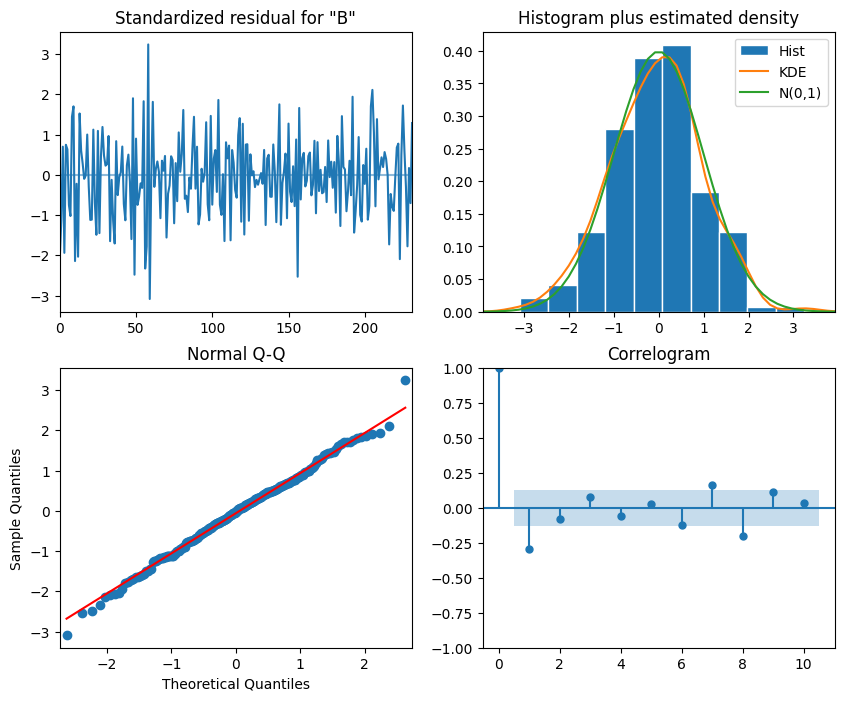

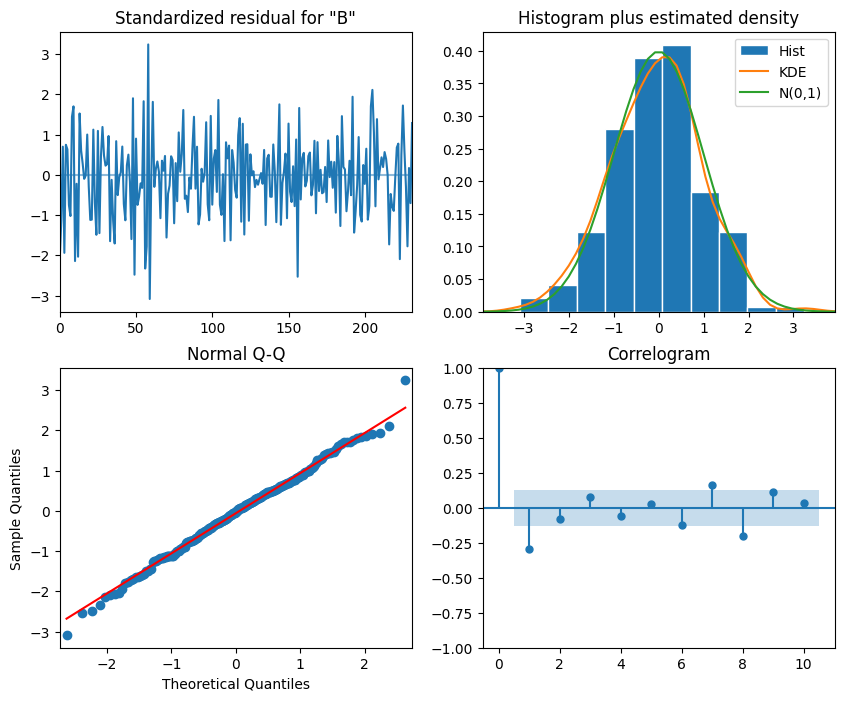

In [ ]:
#SARIMA(p,d,q)(P,D,Q)m, where m=12, d=1,D=1
# p=2,q=3,P=2,Q=3

SARIMA_model = SARIMAX(train, order=(2,1,3),seasonal_order=(2,1,3,12), simple_differencing=False)


SARIMA_model_fit = SARIMA_model.fit(disp=False)
SARIMA_model_fit.plot_diagnostics(figsize=(10,8))

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox


residuals = SARIMA_model_fit.resid
lb = acorr_ljungbox(residuals, np.arange(1, 11, 1))
print(lb)

      lb_stat  lb_pvalue
1    0.504232   0.477647
2    1.556819   0.459136
3    1.557592   0.669043
4    3.548543   0.470536
5    4.890331   0.429411
6    5.010537   0.542462
7    5.865507   0.555538
8    9.042879   0.338692
9    9.597950   0.384002
10  11.640661   0.309825


##Since all p-values ​​are significantly above the significance level (0.05), we see that the residuals of the constructed SARIMA model do not contain significant autocorrelation. And this means that the model explains the data structure well and does not leave significant dependence in the residuals.

##Thus, the residuals of the SARIMA model are white noise, and the trained time series model performs well.

<Figure size 1000x600 with 0 Axes>

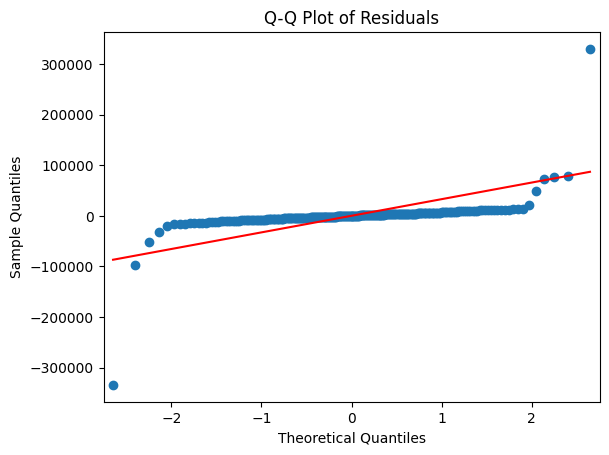

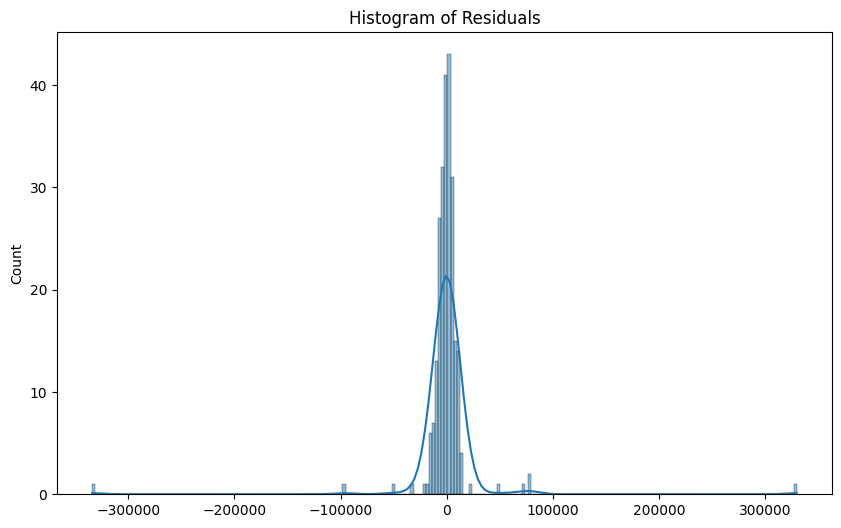

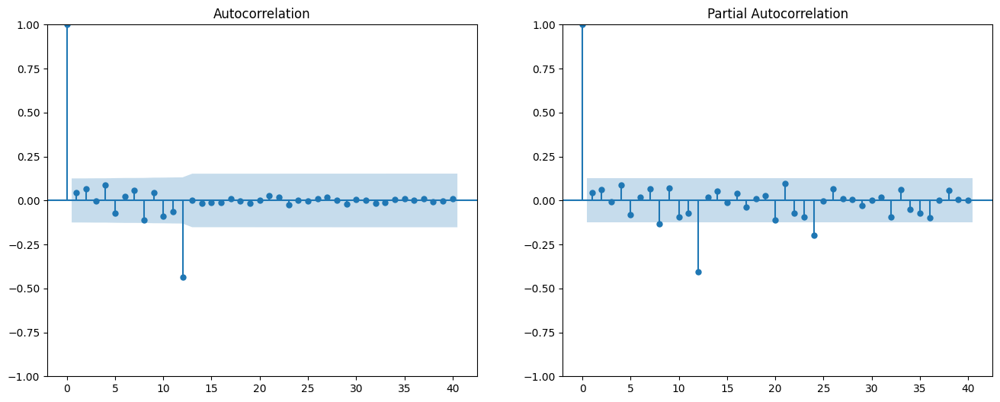

      lb_stat  lb_pvalue
10  11.640661   0.309825


In [ ]:


# Q-Q plot
plt.figure(figsize=(10, 6))
sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

# Гистограмма остатков
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Histogram of Residuals')
plt.show()

# ACF и PACF остатков
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
plot_acf(residuals, lags=40, ax=ax[0])
plot_pacf(residuals, lags=40, ax=ax[1])
plt.show()

# Тест Льюнга-Бокса для автокорреляции остатков
ljung_box_results = acorr_ljungbox(residuals, lags=[10], return_df=True)
print(ljung_box_results)


##**Graph Analysis**
## **1. Q-Q Plot:**

##The points in the center of the plot (near the median) are close to the red line, indicating that the central values ​​of the residuals are approximately normal.
##The extreme points deviate significantly from the red line, indicating the presence of outliers. This indicates that there are outliers or tails in the distribution of residuals that do not correspond to a normal distribution.


## **2. Histogram of residuals:**
##Histogram shape:

##The histogram has a central peak near zero, indicating that most of the residuals are concentrated around the mean.
##However, the histogram shows significant outliers in both the negative and positive regions, confirming the findings from the Q-Q Plot.

##Normal distribution:

##The smooth line on top of the histogram shows the distribution density estimate.
##The distribution has long tails, indicating deviations from normality. The residuals do not completely follow a normal distribution, especially due to the presence of outliers.


In [ ]:
print(len(train))

245


In [ ]:
print(df.shape)

(257, 2)


In [ ]:

SARIMA_pred = SARIMA_model_fit.get_prediction(246,257).predicted_mean


In [ ]:
print(SARIMA_pred)

246    319963.620714
247    334949.155057
248    307988.732019
249    307136.988114
250    304381.533311
251    308158.667672
252    298748.164569
253    269276.746049
254    294962.290004
255    280488.988778
256    297396.624462
257    297088.544355
Name: predicted_mean, dtype: float64


In [ ]:
def mape(y_true, y_pred):
 return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


mape_SARIMA = mape(SARIMA_pred,df['Births'][-12:])

In [ ]:
mape_SARIMA

2.0411903442629207

##We see that the trained SARIMA model performs well.

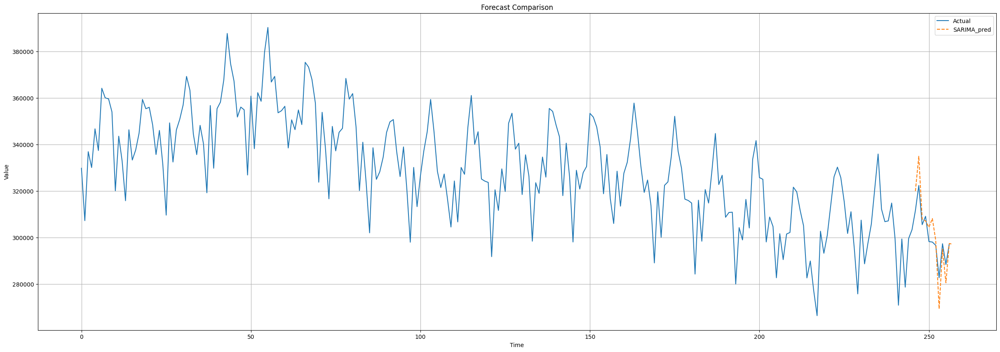

In [ ]:


plt.figure(figsize=(30, 10))
plt.plot(df['Births'], label='Actual')


plt.plot(np.arange(len(train)+1, len(train) + len(df['Births'][-12:])+1),SARIMA_pred, label='SARIMA_pred', linestyle='--')


plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

##Having analyzed the graph, it is clear that the trained SARIMA model works +-well, and also takes into account seasonality and trend.

#**Now I will work with natality, divorce and marriage data. Data taken from the official US CDC website. All data was taken from official journals. For divorce, all 12 issues of the magazines from each year were taken and their individual rates were added up by state. Link to one of the magazine issues:https://www.cdc.gov/nchs/data/nvsr/nvsr56/nvsr56_02.pdf.**


#**This scientific journal with statistics was published from 1990 to 1997, later resuming its public publication from 2006 to 2009. All available data was downloaded and presented in the form:**
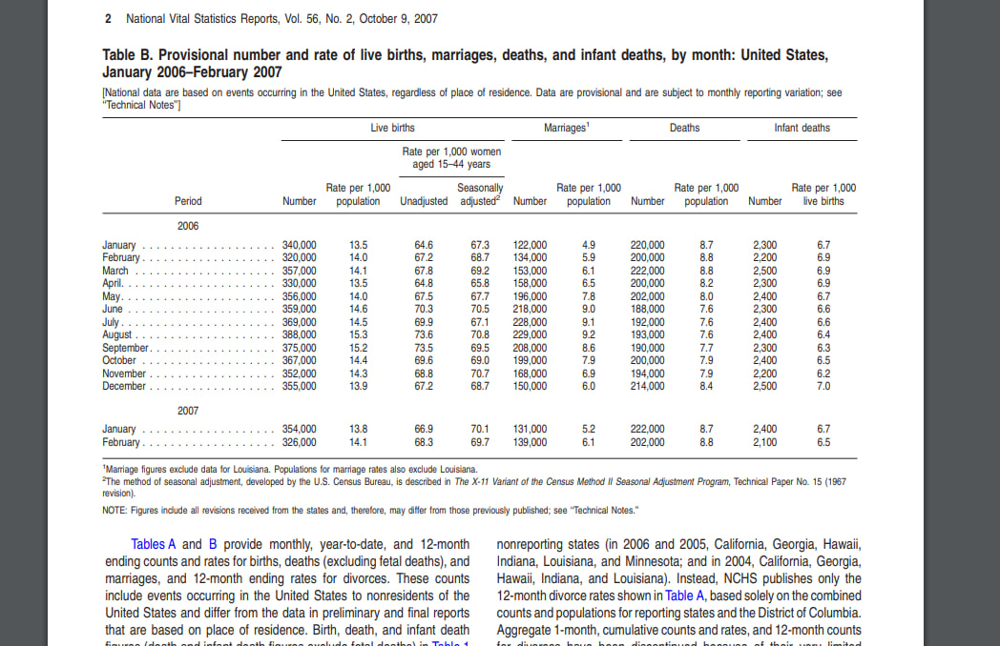
and
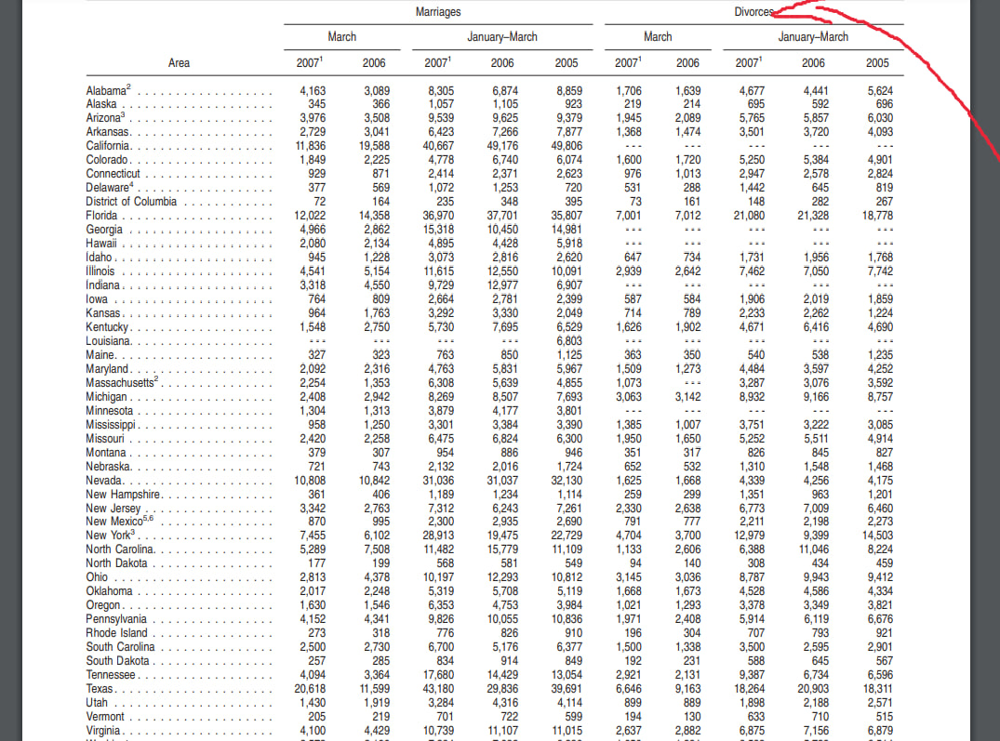
in table form.

##Later all data was rounded into thousandths.Because In some issues of magazines, data on the number of weddings was given only in thousands. Rounding has been done to ensure that all data has the same appearance!

In [9]:
import pandas as pd


file_url = 'https://drive.google.com/uc?export=download&id=1LxmuRyk7WY14XKBbRe7thSJpBRbgurIx'


df = pd.read_csv(file_url, sep=';')


In [ ]:
df

,Period,Live Birth,Merried,Divorces
0,January 1993,325,103,92
1,February 1993,308,154,87
2,March 1993,360,157,113
3,April 1993,328,174,98
4,May 1993,335,221,103
...,...,...,...,...
139,August 1992,350,242,111
140,September 1992,357,227,121
141,October 1992,345,221,99
142,November 1992,332,174,98


#Note All data is in thousands

#**HOORAY!!!**
#**ALL DATA IS PREPARED**

##**2. I will visualise the time series for Live Birth data. Use time series decomposition to extract the trend and seasonal components. Divide the data into train and test sets. Even though I found and downloaded and converted all the available data. I will analyze the longest continuous period: 1990-1997. 8 years is an excellent time period and reliable data will be built on its basis**

In [ ]:
df['Period'] = pd.to_datetime(df['Period'], format='%B %Y')
df = df.sort_values(by='Period')
df = df.reset_index(drop=True)

In [ ]:
df

,Period,Live Birth,Merried,Divorces
0,1990-01-01,330,121,90
1,1990-02-01,316,143,86
2,1990-03-01,342,161,110
3,1990-04-01,330,177,95
4,1990-05-01,368,247,112
...,...,...,...,...
139,2009-08-01,360,212,141
140,2009-09-01,362,205,130
141,2009-10-01,347,196,100
142,2009-11-01,319,153,133


In [ ]:
df= df[(df['Period'].dt.year >= 1990) & (df['Period'].dt.year <= 1997)]

In [ ]:
df

,Period,Live Birth,Merried,Divorces
0,1990-01-01,330,121,90
1,1990-02-01,316,143,86
2,1990-03-01,342,161,110
3,1990-04-01,330,177,95
4,1990-05-01,368,247,112
...,...,...,...,...
91,1997-08-01,341,252,93
92,1997-09-01,353,232,96
93,1997-10-01,329,235,102
94,1997-11-01,304,151,87


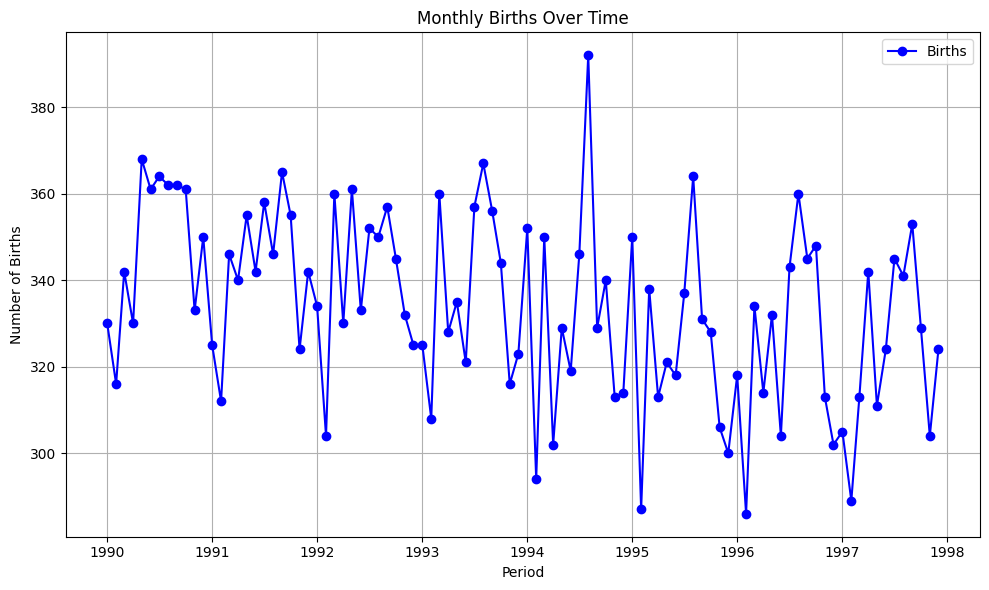

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd



plt.figure(figsize=(10, 6))
plt.plot(df['Period'], df['Live Birth'], marker='o', linestyle='-', color='b', label='Births')


plt.title('Monthly Births Over Time')
plt.xlabel('Period')
plt.ylabel('Number of Births')
plt.grid(True)
plt.legend()


plt.tight_layout()
plt.show()


##I will build a more convenient and visual chart

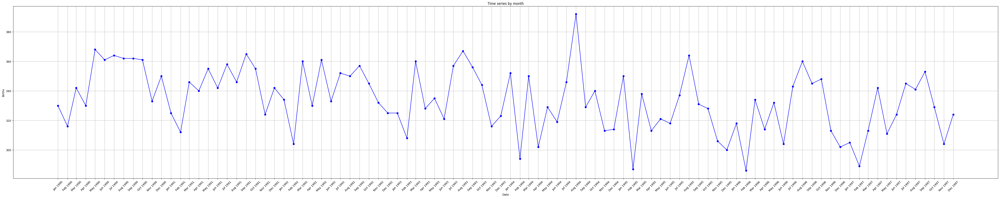

In [ ]:
import matplotlib.dates as mdates

plt.figure(figsize=(50, 10))
plt.plot(df['Period'], df['Live Birth'], marker='o', linestyle='-', color='b', label='Births')
plt.title('Time series by month')
plt.xlabel('Date')
plt.ylabel('Births')



plt.xticks(df['Period'], df['Period'].dt.strftime('%b %Y'), rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

plt.grid(True)
plt.tight_layout()
plt.show()

#**Now we can comfortably view all the data by analyzing the plot**
##Having studied the graph, we see seasonality: that in summer: June, July, August the highest birth rate; And February and November have the lowest birth rates. And with the help of SARIMA in further steps I will take this into account.

##I will use time series decomposition to to extract the trend and seasonal components.

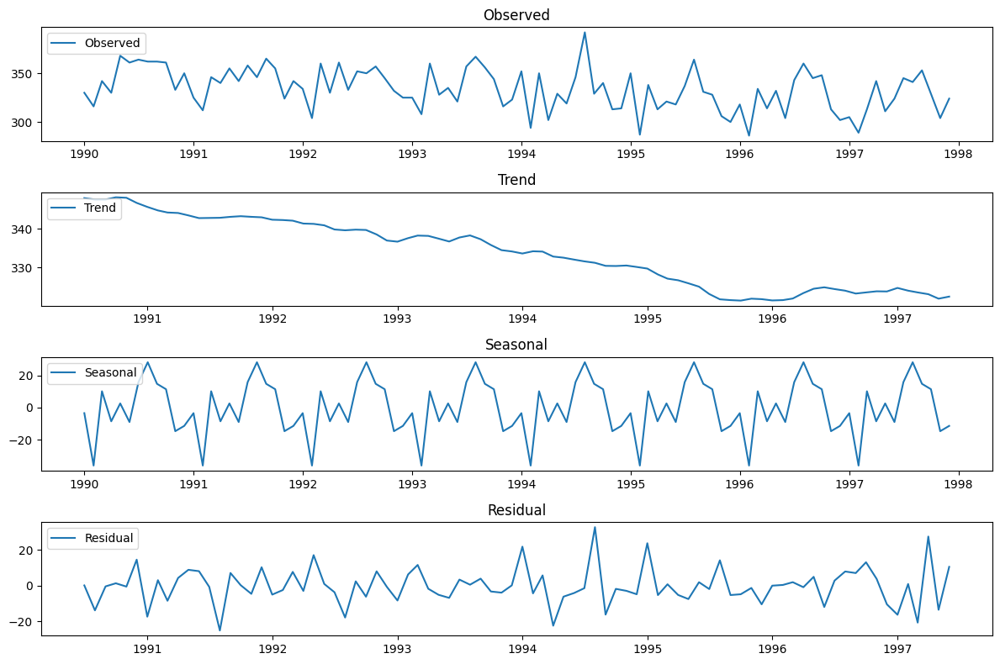

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose


result = seasonal_decompose(df['Live Birth'], model='additive', period=12)  # period=12 указывает на годовую сезонность


plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(df['Period'], result.observed, label='Observed')
plt.legend(loc='upper left')
plt.title('Observed')

plt.subplot(412)
plt.plot(df['Period'], result.trend, label='Trend')
plt.legend(loc='upper left')
plt.title('Trend')

plt.subplot(413)
plt.plot(df['Period'], result.seasonal, label='Seasonal')
plt.legend(loc='upper left')
plt.title('Seasonal')

plt.subplot(414)
plt.plot(df['Period'], result.resid, label='Residual')
plt.legend(loc='upper left')
plt.title('Residual')

plt.tight_layout()
plt.show()

###And I also will use the STL function from statsmodels:

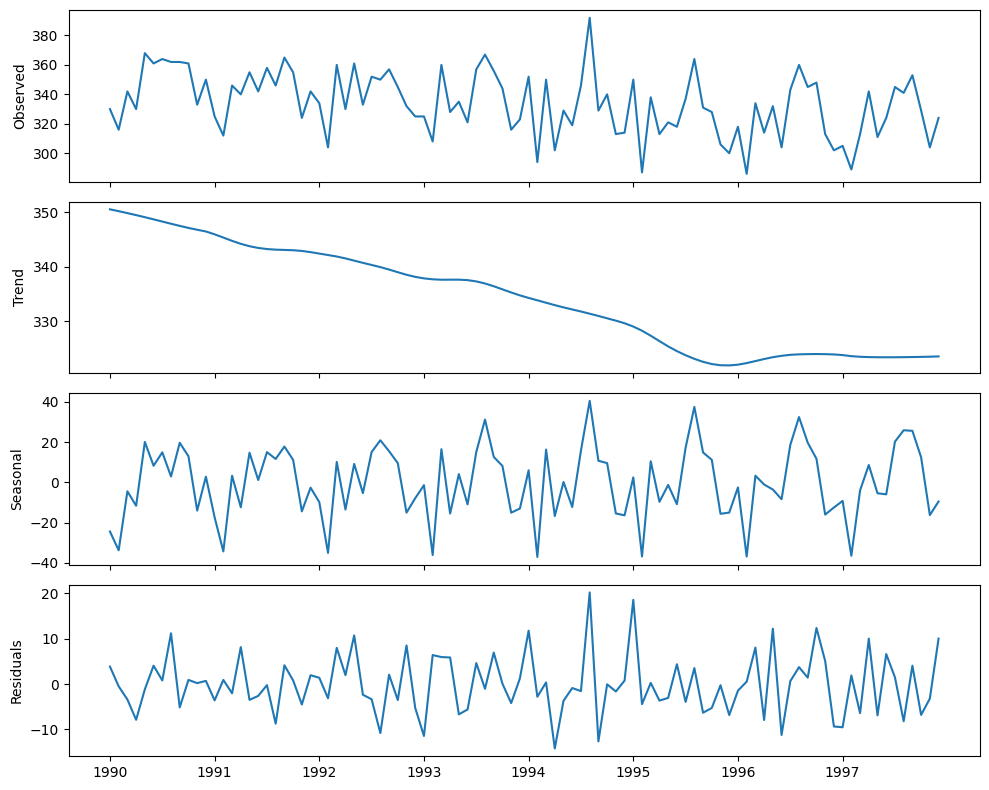

In [ ]:
from statsmodels.tsa.seasonal import STL
import numpy as np


decomposition = STL(df['Live Birth'], period=12).fit()


fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10, 8))

ax1.plot(decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(decomposition.resid)
ax4.set_ylabel('Residuals')

plt.xticks(np.arange(0, len(df), 12), df['Period'].dt.year.unique())

plt.tight_layout()
plt.show()

##1. The trend decreases from 1990 to 1997, after which it stabilizes. The trend component shows a steady decline throughout almost the entire period.

##2. Seasonal variations occur regularly, indicating that there are periodic factors influencing the data. The amplitude of the oscillations remains relatively constant throughout the entire period, with periodic increases and decreases.

##3. Residual. The residual components do not show obvious trends or seasonal patterns.

##**I will divide the data into train and test sets.**

In [89]:
train_size = int(len(df) * 0.8)
train_b = df['Live Birth'].iloc[:-12]
test_b = df['Live Birth'].iloc[-12:]

In [ ]:
print(train_b.shape)
print(test_b.shape)

(84,)
(12,)


##**3. I will fit a SARIMA model.**

##**1. I'll check if the data is stationary.**

Run the ADF test and check if the process is stationary. If not, apply differencing.

I will use Augmented Dickey–Fuller (ADF) Test to check if the data is stationary.

The null hypothesis: there is a unit root present in a time series.

The augmented Dickey-Fuller (ADF) test helps us determine if a time series is stationary by testing for the presence of a unit root. If a unit root is present, the time series is not stationary.

In [ ]:
from statsmodels.tsa.stattools import adfuller


ADF_result = adfuller(df['Live Birth'])
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')


ADF Statistic: -1.1439320434140905
p-value: 0.6972383069547854


An ADF statistic of -1.1439320434140905 and a p-value of   0.6972383069547854. The ADF statistic is not large negative number, and with a p-value greater than 0.05, we can not reject the null hypothesis. The series is not stationary.

Conclusion: the dataset is **not** stationary.

##Differencing

In [ ]:
import numpy as np

diff_df=np.diff(df['Live Birth'], n=1)

In [ ]:
ADF_result = adfuller(diff_df)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -14.356064066613714
p-value: 1.0029441741001654e-26


###The dataset is stationary.

### let’s apply a seasonal difference and test for stationarity:

In [ ]:
df_diff_seasonal = np.diff(df['Live Birth'], n=12)
ADF_result = adfuller(df_diff_seasonal)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -12.672280842243271
p-value: 1.2370851011362418e-23


This results in an ADF statistic of -12.672280842243271 and a
p-value of 1.2370851011362418e-23 . Stationary.


And order of integration (global) - 0

And order of integration (seasonal) - 1

In [ ]:
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
d = 0
D = 1
m = 12

In [ ]:
from itertools import product


SARIMA_order_list = list(product(ps, qs, Ps, Qs))
print(SARIMA_order_list)

[(0, 0, 0, 0), (0, 0, 0, 1), (0, 0, 0, 2), (0, 0, 0, 3), (0, 0, 1, 0), (0, 0, 1, 1), (0, 0, 1, 2), (0, 0, 1, 3), (0, 0, 2, 0), (0, 0, 2, 1), (0, 0, 2, 2), (0, 0, 2, 3), (0, 0, 3, 0), (0, 0, 3, 1), (0, 0, 3, 2), (0, 0, 3, 3), (0, 1, 0, 0), (0, 1, 0, 1), (0, 1, 0, 2), (0, 1, 0, 3), (0, 1, 1, 0), (0, 1, 1, 1), (0, 1, 1, 2), (0, 1, 1, 3), (0, 1, 2, 0), (0, 1, 2, 1), (0, 1, 2, 2), (0, 1, 2, 3), (0, 1, 3, 0), (0, 1, 3, 1), (0, 1, 3, 2), (0, 1, 3, 3), (0, 2, 0, 0), (0, 2, 0, 1), (0, 2, 0, 2), (0, 2, 0, 3), (0, 2, 1, 0), (0, 2, 1, 1), (0, 2, 1, 2), (0, 2, 1, 3), (0, 2, 2, 0), (0, 2, 2, 1), (0, 2, 2, 2), (0, 2, 2, 3), (0, 2, 3, 0), (0, 2, 3, 1), (0, 2, 3, 2), (0, 2, 3, 3), (0, 3, 0, 0), (0, 3, 0, 1), (0, 3, 0, 2), (0, 3, 0, 3), (0, 3, 1, 0), (0, 3, 1, 1), (0, 3, 1, 2), (0, 3, 1, 3), (0, 3, 2, 0), (0, 3, 2, 1), (0, 3, 2, 2), (0, 3, 2, 3), (0, 3, 3, 0), (0, 3, 3, 1), (0, 3, 3, 2), (0, 3, 3, 3), (1, 0, 0, 0), (1, 0, 0, 1), (1, 0, 0, 2), (1, 0, 0, 3), (1, 0, 1, 0), (1, 0, 1, 1), (1, 0, 1, 2), (1, 0

In [ ]:

import pandas as pd
from typing import Union
from tqdm import tqdm_notebook
from statsmodels.tsa.statespace.sarimax import SARIMAX
from itertools import product

def optimize_SARIMA(endog: Union[pd.Series, list], order_list: list, d: int, D: int, m: int) -> pd.DataFrame:
    results = []
    for order in tqdm_notebook(order_list, desc='Optimizing SARIMA'):
        try:
            model = SARIMAX(endog, order=(order[0], d, order[1]),
                            seasonal_order=(order[2], D, order[3], m),
                            enforce_stationarity=False,
                            enforce_invertibility=False,
                            simple_differencing=False).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except Exception as e:
            print(f"Error with order {order}: {e}")
            continue

    result_df = pd.DataFrame(results, columns=['(p, q, P, Q)', 'AIC'])


    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)

    return result_df




In [ ]:
SARIMA_statistic_b=optimize_SARIMA(train_b,SARIMA_order_list, d,D,m)

<ipython-input-19-2c22419d3f4b>:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list, desc='Optimizing SARIMA'):


Optimizing SARIMA:   0%|          | 0/256 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
print(SARIMA_statistic_b)

     (p, q, P, Q)         AIC
0    (3, 3, 1, 3)  241.527811
1    (3, 3, 2, 3)  241.630417
2    (3, 3, 0, 3)  245.123197
3    (3, 3, 3, 1)  247.302800
4    (3, 2, 1, 3)  249.616174
..            ...         ...
251  (2, 1, 0, 0)  554.704806
252  (0, 1, 0, 0)  555.072506
253  (2, 0, 0, 0)  555.710053
254  (0, 0, 0, 0)  560.178209
255  (1, 0, 0, 0)  561.993886

[256 rows x 2 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


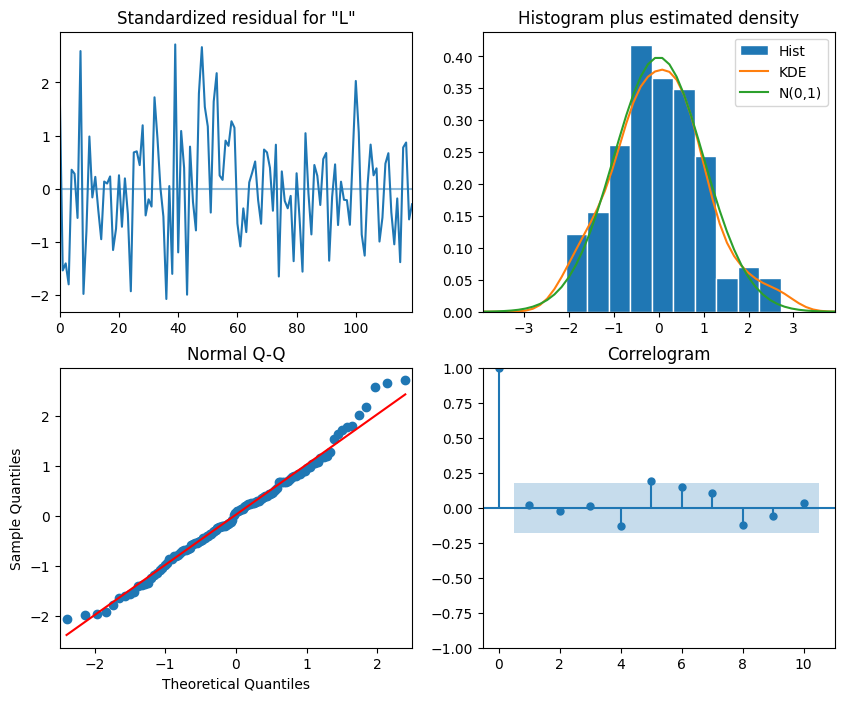

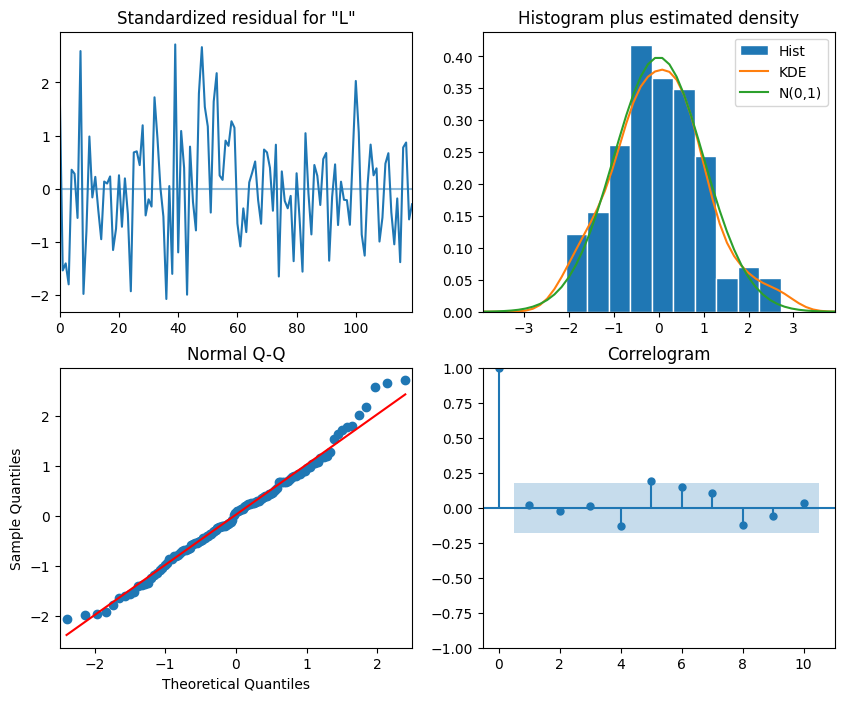

In [90]:
#SARIMA(p,d,q)(P,D,Q)m, where m=12, d=0,D=1
# p=3,q=3,P=1,Q=3

SARIMA_model_b = SARIMAX(train_b, order=(3,0,3),seasonal_order=(1,1,3,12), simple_differencing=False)


SARIMA_model_fit = SARIMA_model_b.fit(disp=False)
SARIMA_model_fit.plot_diagnostics(figsize=(10,8))

In [ ]:
print(len(train_b))

84


In [ ]:
print(df.shape)

(96, 4)


In [91]:

SARIMA_pred_b = SARIMA_model_fit.get_prediction(85,96).predicted_mean


In [ ]:
print(SARIMA_pred_b)

85    286.873701
86    330.539576
87    312.381071
88    330.497184
89    304.537634
90    340.029851
91    351.528267
92    343.130176
93    341.290747
94    308.941178
95    303.394386
96    308.746469
Name: predicted_mean, dtype: float64


In [ ]:
def mape(y_true, y_pred):
 return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


mape_SARIMA = mape(SARIMA_pred_b,df['Live Birth'][-12:])

In [ ]:
mape_SARIMA

4.28588869036049

##We see that the trained SARIMA model performs quite well.

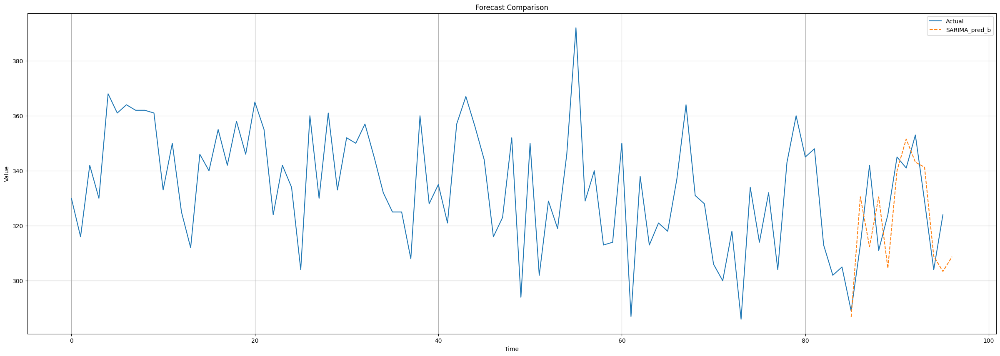

In [ ]:


plt.figure(figsize=(30, 10))
plt.plot(df['Live Birth'], label='Actual')

plt.plot(np.arange(len(train_b)+1, len(train_b) + len(test_b)+1),SARIMA_pred_b, label='SARIMA_pred_b', linestyle='--')


plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

##Having analyzed the graph, it is clear that the trained SARIMA model works well, and also takes into account seasonality and trend. And having also analyzed all the graphs that were presented in the Live Birth analysis, we also conclude that the SARIMA model works quite well for Live Birth(but not perfect!).

##**2 b). Well, and now I will visualise the time series for Divorces data. Use time series decomposition to extract the trend and seasonal components. Divide the data into train and test sets.**

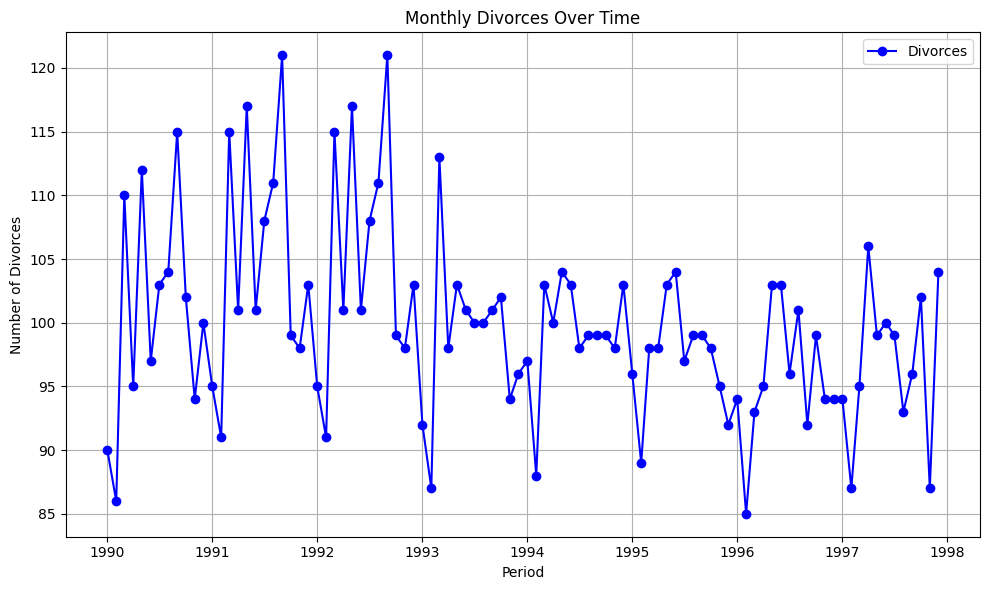

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd



plt.figure(figsize=(10, 6))
plt.plot(df['Period'], df['Divorces'], marker='o', linestyle='-', color='b', label='Divorces')

# Formatting
plt.title('Monthly Divorces Over Time')
plt.xlabel('Period')
plt.ylabel('Number of Divorces')
plt.grid(True)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()


#Already on this graph you can see seasonality.

##I will build a more convenient and visual chart

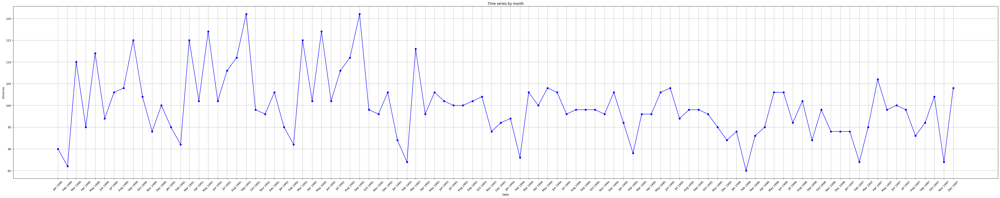

In [ ]:
import matplotlib.dates as mdates

plt.figure(figsize=(50, 10))
plt.plot(df['Period'], df['Divorces'], marker='o', linestyle='-', color='b', label='Divorces')
plt.title('Time series by month')
plt.xlabel('Date')
plt.ylabel('Divorces')



plt.xticks(df['Period'], df['Period'].dt.strftime('%b %Y'), rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

plt.grid(True)
plt.tight_layout()
plt.show()

#**Now we can comfortably view all the data by analyzing the plot**
##Having studied the graph, we see seasonality: that in summer: June and August the highest Weddings rate; And January and March have the lowest Divorces rates.

##I will use time series decomposition to to extract the trend and seasonal components.

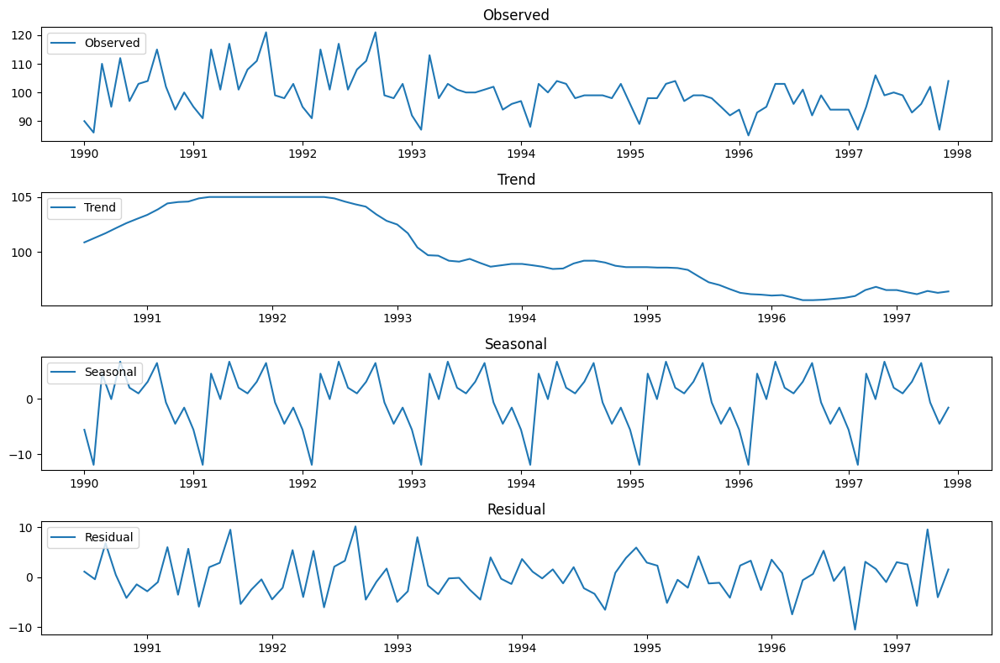

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose


result = seasonal_decompose(df['Divorces'], model='additive', period=12)


plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(df['Period'], result.observed, label='Observed')
plt.legend(loc='upper left')
plt.title('Observed')

plt.subplot(412)
plt.plot(df['Period'], result.trend, label='Trend')
plt.legend(loc='upper left')
plt.title('Trend')

plt.subplot(413)
plt.plot(df['Period'], result.seasonal, label='Seasonal')
plt.legend(loc='upper left')
plt.title('Seasonal')

plt.subplot(414)
plt.plot(df['Period'], result.resid, label='Residual')
plt.legend(loc='upper left')
plt.title('Residual')

plt.tight_layout()
plt.show()

###And I also will use the STL function from statsmodels:

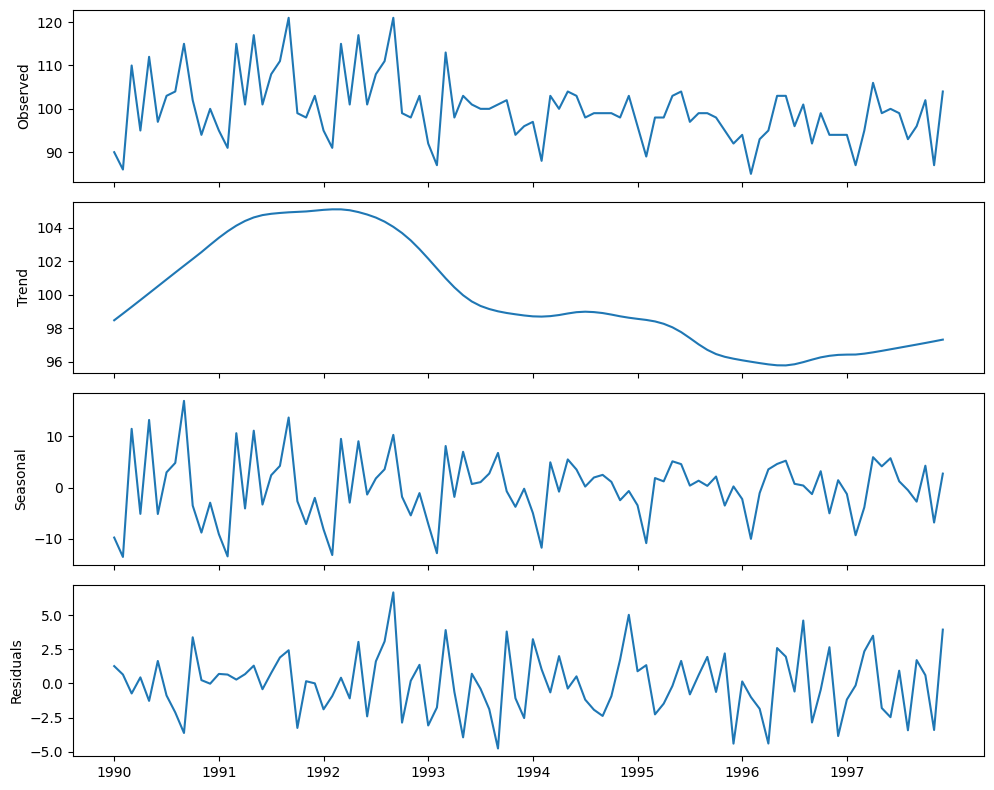

In [ ]:
from statsmodels.tsa.seasonal import STL
import numpy as np


decomposition = STL(df['Divorces'], period=12).fit()


fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10, 8))

ax1.plot(decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(decomposition.resid)
ax4.set_ylabel('Residuals')

plt.xticks(np.arange(0, len(df), 12), df['Period'].dt.year.unique())

plt.tight_layout()
plt.show()

##1. The trend component shows that the data grew until the end of 1992, after which it began to decline. From the end of 1994 to the end of 1997, the trend stabilized at a low level.

##2. The graph shows regular seasonal fluctuations with approximately the same amplitude. Seasonality persists throughout the observation period, indicating regular cycles in the data.

##3. Residual.The residuals after removing the trend and seasonality appear random and fluctuate around zero, which confirms the correctness of the decomposition.

##**I will divide the data into train and test sets.**

In [52]:
train_size = int(len(df) * 0.8)
train_d = df['Divorces'].iloc[:-12]
test_d = df['Divorces'].iloc[-12:]

##**3. I will fit a SARIMA model.**

##**1. I'll check if the data is stationary.**

Run the ADF test and check if the process is stationary. If not, apply differencing.

I will use Augmented Dickey–Fuller (ADF) Test to check if the data is stationary.

The null hypothesis: there is a unit root present in a time series.

The augmented Dickey-Fuller (ADF) test helps us determine if a time series is stationary by testing for the presence of a unit root. If a unit root is present, the time series is not stationary.

In [10]:
from statsmodels.tsa.stattools import adfuller


ADF_result = adfuller(df['Divorces'])
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')


ADF Statistic: -2.088253804776287
p-value: 0.24926396160152337



Conclusion: the dataset is **not** stationary.

##Differencing

In [11]:
import numpy as np

diff_df=np.diff(df['Divorces'], n=1)

In [12]:
ADF_result = adfuller(diff_df)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -2.95203631856619
p-value: 0.03962291186970935


###The dataset is not stationary.

In [13]:
diff_df_2=np.diff(diff_df, n=1)
ADF_result = adfuller(diff_df_2)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -11.008385809621933
p-value: 6.417308412813394e-20


###The dataset is stationary.
### Let’s apply a seasonal difference and test for stationarity:

In [ ]:
df_diff_seasonal = np.diff(diff_df, n=12)
ADF_result = adfuller(df_diff_seasonal)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -8.961377045153206
p-value: 8.206936526589172e-15


This results in an ADF statistic of -8.961377045153206 and a
p-value of 8.206936526589172e-15. Stationary.


And order of integration (global) - 1

And order of integration (seasonal) - 1

In [14]:
df_diff_seasonal = np.diff(df['Divorces'], n=12)
ADF_result = adfuller(df_diff_seasonal)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -14.04663845354557
p-value: 3.2319809540485407e-26


This results in an ADF statistic of -14.04663845354557 and a
p-value of 3.2319809540485407e-26. Stationary.

**I'll check first:**
And order of integration (global) - 1

And order of integration (seasonal) - 1


**After:**
And order of integration (global) - 0

And order of integration (seasonal) - 1

In [19]:
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
d = 1
D = 1
m = 12

In [20]:
from itertools import product


SARIMA_order_list = list(product(ps, qs, Ps, Qs))
print(SARIMA_order_list)

[(0, 0, 0, 0), (0, 0, 0, 1), (0, 0, 0, 2), (0, 0, 0, 3), (0, 0, 1, 0), (0, 0, 1, 1), (0, 0, 1, 2), (0, 0, 1, 3), (0, 0, 2, 0), (0, 0, 2, 1), (0, 0, 2, 2), (0, 0, 2, 3), (0, 0, 3, 0), (0, 0, 3, 1), (0, 0, 3, 2), (0, 0, 3, 3), (0, 1, 0, 0), (0, 1, 0, 1), (0, 1, 0, 2), (0, 1, 0, 3), (0, 1, 1, 0), (0, 1, 1, 1), (0, 1, 1, 2), (0, 1, 1, 3), (0, 1, 2, 0), (0, 1, 2, 1), (0, 1, 2, 2), (0, 1, 2, 3), (0, 1, 3, 0), (0, 1, 3, 1), (0, 1, 3, 2), (0, 1, 3, 3), (0, 2, 0, 0), (0, 2, 0, 1), (0, 2, 0, 2), (0, 2, 0, 3), (0, 2, 1, 0), (0, 2, 1, 1), (0, 2, 1, 2), (0, 2, 1, 3), (0, 2, 2, 0), (0, 2, 2, 1), (0, 2, 2, 2), (0, 2, 2, 3), (0, 2, 3, 0), (0, 2, 3, 1), (0, 2, 3, 2), (0, 2, 3, 3), (0, 3, 0, 0), (0, 3, 0, 1), (0, 3, 0, 2), (0, 3, 0, 3), (0, 3, 1, 0), (0, 3, 1, 1), (0, 3, 1, 2), (0, 3, 1, 3), (0, 3, 2, 0), (0, 3, 2, 1), (0, 3, 2, 2), (0, 3, 2, 3), (0, 3, 3, 0), (0, 3, 3, 1), (0, 3, 3, 2), (0, 3, 3, 3), (1, 0, 0, 0), (1, 0, 0, 1), (1, 0, 0, 2), (1, 0, 0, 3), (1, 0, 1, 0), (1, 0, 1, 1), (1, 0, 1, 2), (1, 0

In [16]:

import pandas as pd
from typing import Union
from tqdm import tqdm_notebook
from statsmodels.tsa.statespace.sarimax import SARIMAX
from itertools import product

def optimize_SARIMA(endog: Union[pd.Series, list], order_list: list, d: int, D: int, m: int) -> pd.DataFrame:
    results = []
    for order in tqdm_notebook(order_list, desc='Optimizing SARIMA'):
        try:
            model = SARIMAX(endog, order=(order[0], d, order[1]),
                            seasonal_order=(order[2], D, order[3], m),
                            enforce_stationarity=False,
                            enforce_invertibility=False,
                            simple_differencing=False).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except Exception as e:
            print(f"Error with order {order}: {e}")
            continue

    result_df = pd.DataFrame(results, columns=['(p, q, P, Q)', 'AIC'])


    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)

    return result_df




#**1.**

In [ ]:
SARIMA_statistic_d=optimize_SARIMA(train_d,SARIMA_order_list, d,D,m)

<ipython-input-92-2c22419d3f4b>:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list, desc='Optimizing SARIMA'):


Optimizing SARIMA:   0%|          | 0/256 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
print(SARIMA_statistic_d)

     (p, q, P, Q)         AIC
0    (2, 3, 1, 3)  170.769561
1    (0, 3, 0, 3)  171.249763
2    (0, 3, 2, 3)  171.505318
3    (3, 3, 1, 3)  172.042536
4    (0, 3, 1, 3)  172.784652
..            ...         ...
251  (1, 1, 0, 0)  405.674859
252  (2, 1, 0, 0)  405.782370
253  (2, 0, 0, 0)  407.789463
254  (1, 0, 0, 0)  425.005530
255  (0, 0, 0, 0)  441.512705

[256 rows x 2 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


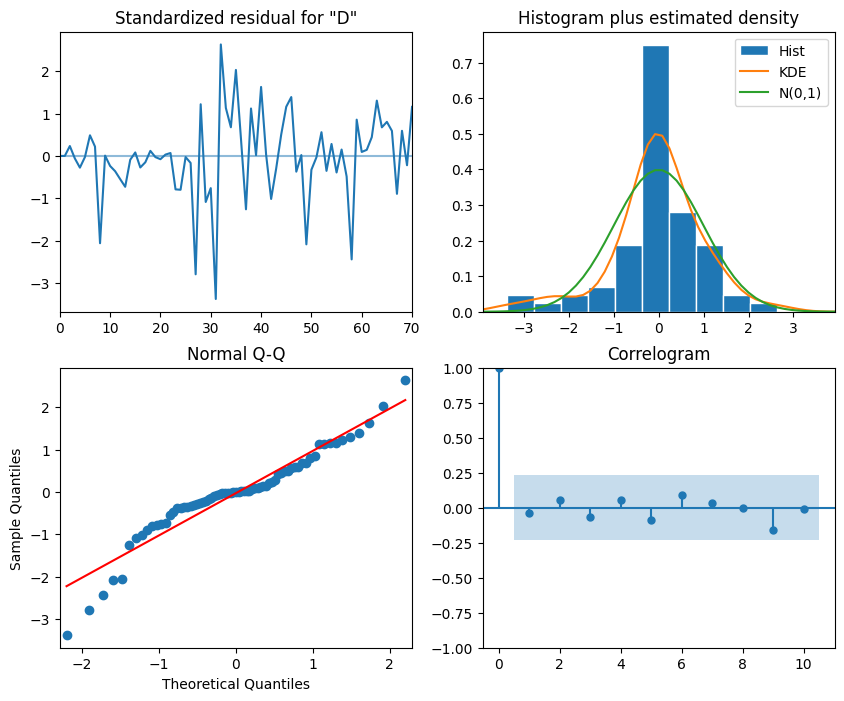

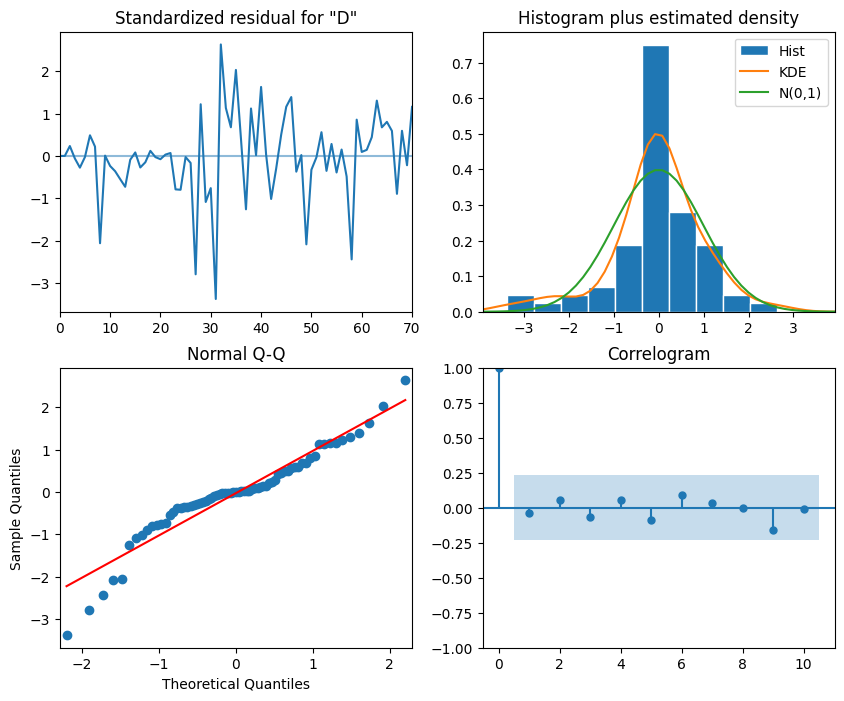

In [ ]:
#SARIMA(p,d,q)(P,D,Q)m, where m=12, d=1,D=1
#p=2,q=3,P=1,Q=3

SARIMA_model_d = SARIMAX(train_d, order=(2,1,3),seasonal_order=(1,1,3,12), simple_differencing=False)


SARIMA_model_fit_d = SARIMA_model_d.fit(disp=False)
SARIMA_model_fit_d.plot_diagnostics(figsize=(10,8))

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox


residuals = SARIMA_model_fit_d.resid
lb = acorr_ljungbox(residuals, np.arange(1, 11, 1))
print(lb)

      lb_stat  lb_pvalue
1    1.552919   0.212705
2    6.878184   0.032094
3    7.938695   0.047296
4    9.251654   0.055108
5   10.620120   0.059454
6   10.796490   0.094874
7   11.052985   0.136324
8   11.055895   0.198552
9   11.056147   0.271880
10  13.243522   0.210373


<Figure size 1000x600 with 0 Axes>

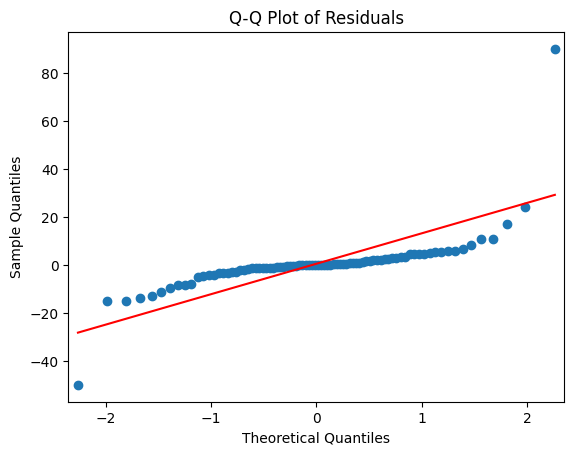

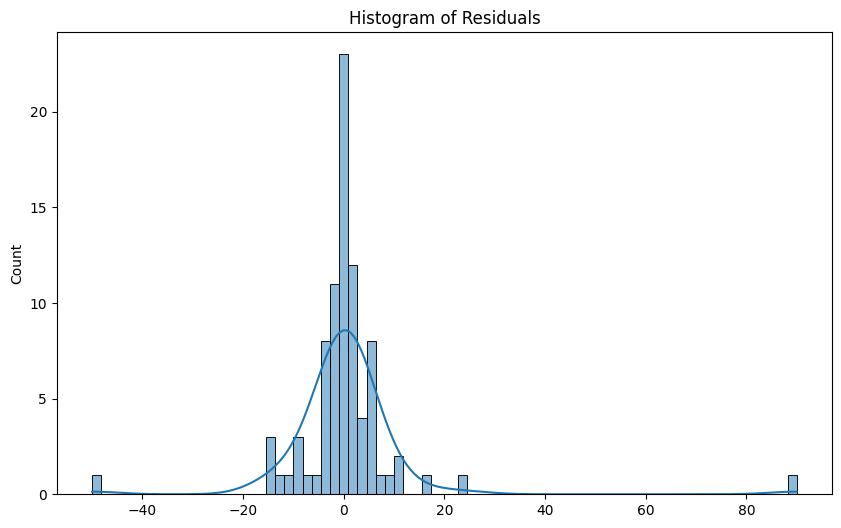

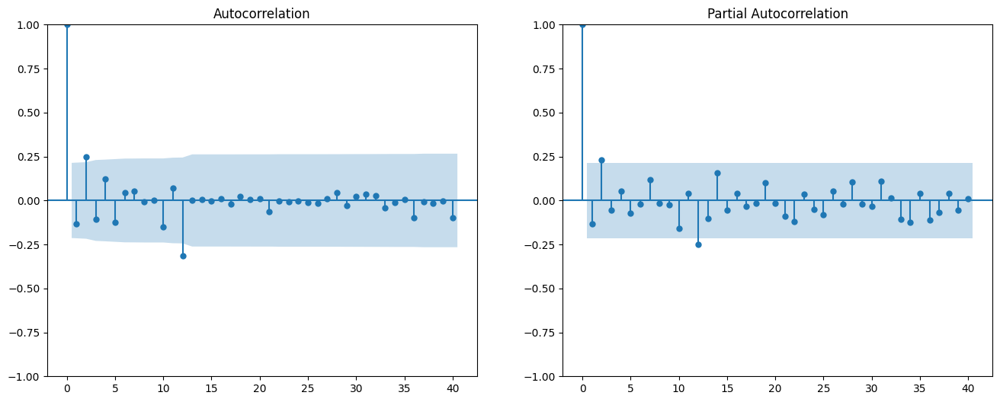

      lb_stat  lb_pvalue
10  13.243522   0.210373


In [ ]:


# Q-Q plot
plt.figure(figsize=(10, 6))
sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Histogram of Residuals')
plt.show()


fig, ax = plt.subplots(1, 2, figsize=(16, 6))
plot_acf(residuals, lags=40, ax=ax[0])
plot_pacf(residuals, lags=40, ax=ax[1])
plt.show()


ljung_box_results = acorr_ljungbox(residuals, lags=[10], return_df=True)
print(ljung_box_results)


In [ ]:

SARIMA_pred_d = SARIMA_model_fit_d.get_prediction(85,96).predicted_mean


In [ ]:
print(SARIMA_pred_d)

85     85.721419
86     94.096847
87     96.649468
88    103.540347
89    105.803492
90     97.878036
91    100.941763
92     92.535171
93    101.530484
94     96.371139
95     98.419593
96     97.597468
Name: predicted_mean, dtype: float64


In [ ]:
def mape(y_true, y_pred):
 return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


mape_SARIMA = mape(SARIMA_pred_d,df['Divorces'][-12:])

In [ ]:
mape_SARIMA

4.601006379628442

##We see that the trained SARIMA model performs does'n well.

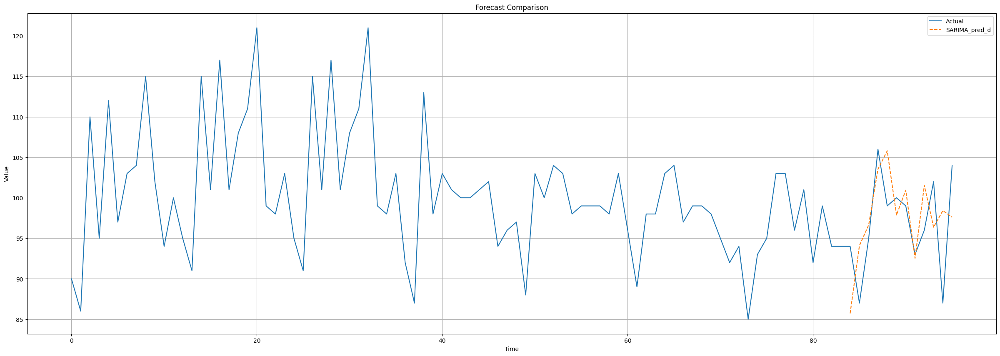

In [ ]:


plt.figure(figsize=(30, 10))
plt.plot(df['Divorces'], label='Actual')


plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),SARIMA_pred_d, label='SARIMA_pred_d', linestyle='--')


plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

##Having analyzed the graph, it is clear that the trained SARIMA model works +-good. And having also analyzed all the graphs that were presented in the Divorces analysis, we also conclude that the SARIMA model works quite well for Divorces.

#**2.**

In [21]:
d_1=0
SARIMA_statistic_d_2=optimize_SARIMA(train_d,SARIMA_order_list, d_1,D,m)

<ipython-input-16-2c22419d3f4b>:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list, desc='Optimizing SARIMA'):


Optimizing SARIMA:   0%|          | 0/256 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

In [ ]:
print(SARIMA_statistic_d_2)

     (p, q, P, Q)         AIC
0    (2, 3, 1, 3)  170.769561
1    (0, 3, 0, 3)  171.249763
2    (0, 3, 2, 3)  171.505318
3    (3, 3, 1, 3)  172.042536
4    (0, 3, 1, 3)  172.784652
..            ...         ...
251  (1, 1, 0, 0)  405.674859
252  (2, 1, 0, 0)  405.782370
253  (2, 0, 0, 0)  407.789463
254  (1, 0, 0, 0)  425.005530
255  (0, 0, 0, 0)  441.512705

[256 rows x 2 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


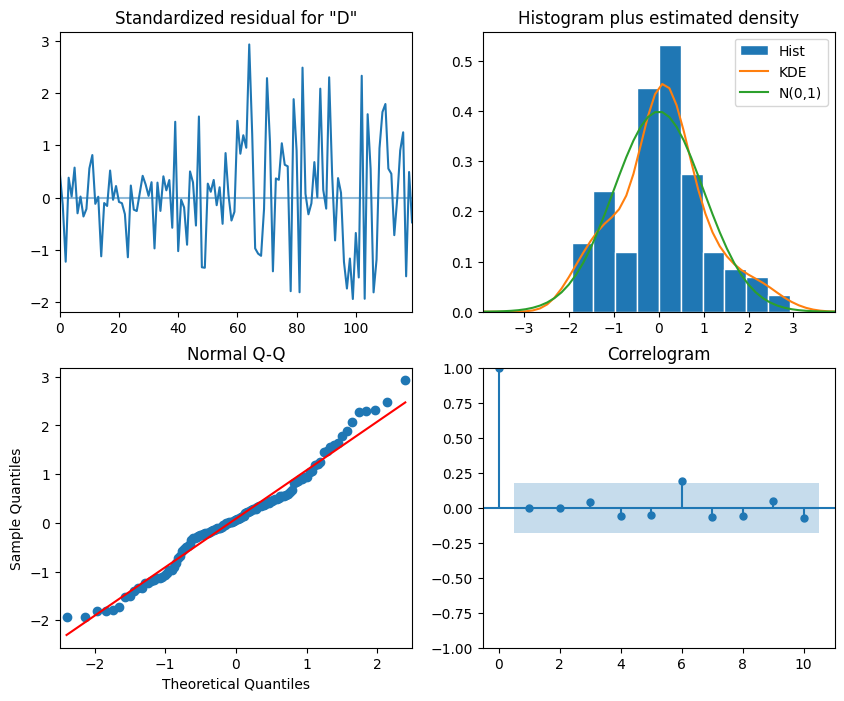

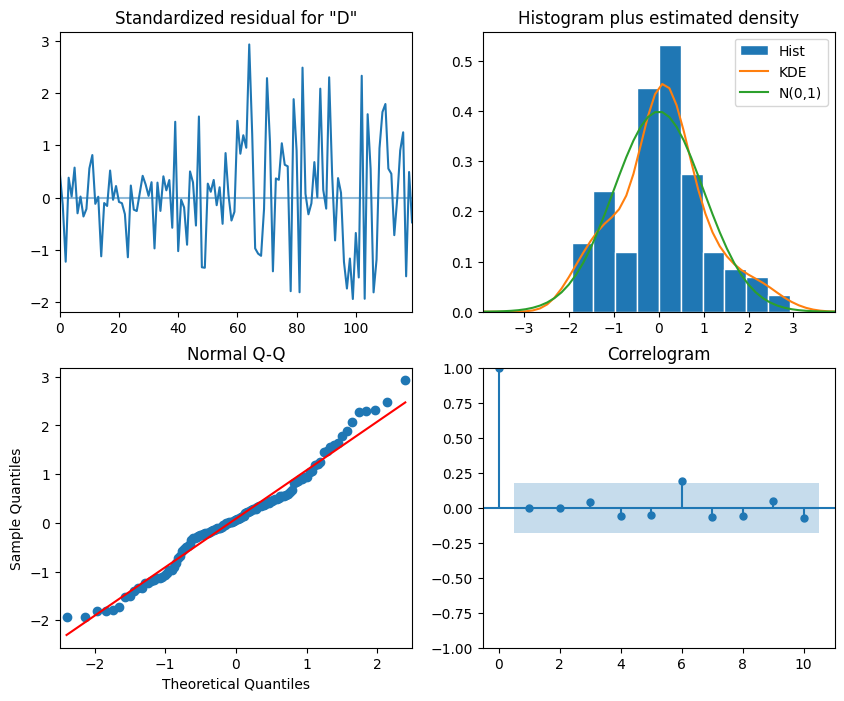

In [23]:
#SARIMA(p,d,q)(P,D,Q)m, where m=12, d=0,D=1
#p=2,q=3,P=1,Q=3

SARIMA_model_d_2 = SARIMAX(train_d, order=(2,0,3),seasonal_order=(1,1,3,12), simple_differencing=False)


SARIMA_model_fit_d_2 = SARIMA_model_d_2.fit(disp=False)
SARIMA_model_fit_d_2.plot_diagnostics(figsize=(10,8))

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox


residuals = SARIMA_model_fit_d_2.resid
lb = acorr_ljungbox(residuals, np.arange(1, 11, 1))
print(lb)

       lb_stat     lb_pvalue
1   101.173769  8.425776e-24
2   188.209477  1.351548e-41
3   255.306510  4.656482e-55
4   307.823532  2.223585e-65
5   347.528353  5.959705e-73
6   378.729034  1.042772e-78
7   398.277870  5.582549e-82
8   410.123705  1.278325e-83
9   416.635078  3.855328e-84
10  418.460906  1.104077e-83


<Figure size 1000x600 with 0 Axes>

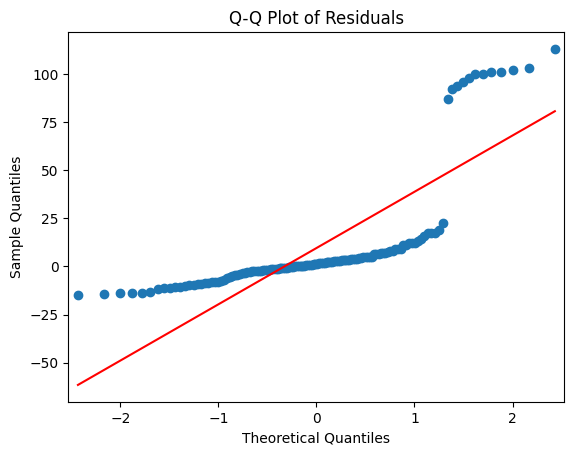

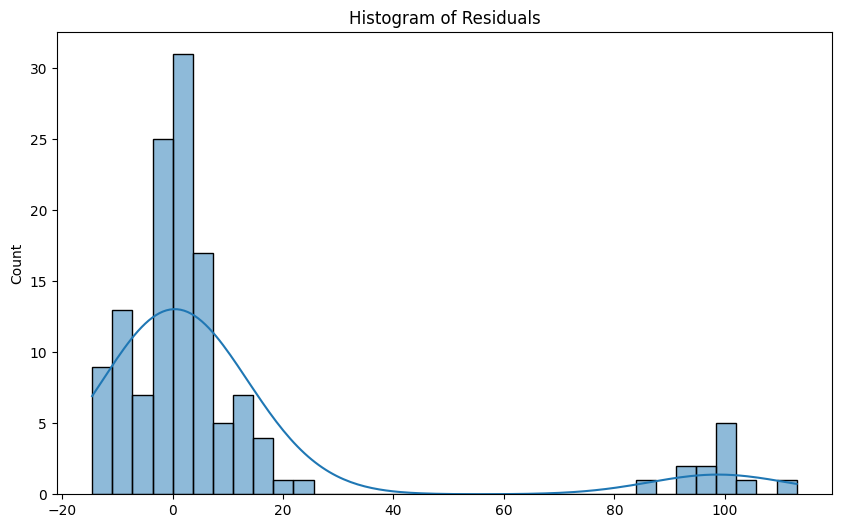

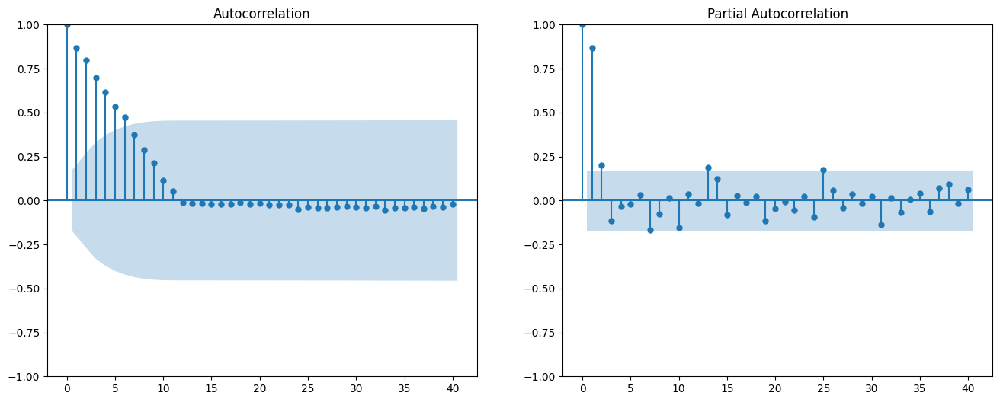

       lb_stat     lb_pvalue
10  418.460906  1.104077e-83


In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox

# Q-Q plot
plt.figure(figsize=(10, 6))
sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

# Гистограмма остатков
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Histogram of Residuals')
plt.show()

# ACF и PACF остатков
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
plot_acf(residuals, lags=40, ax=ax[0])
plot_pacf(residuals, lags=40, ax=ax[1])
plt.show()

# Тест Льюнга-Бокса для автокорреляции остатков
ljung_box_results = acorr_ljungbox(residuals, lags=[10], return_df=True)
print(ljung_box_results)


In [28]:

SARIMA_pred_d = SARIMA_model_fit_d_2.get_prediction(85,96).predicted_mean


In [29]:
print(SARIMA_pred_d)

85     92.233927
86    119.426929
87    113.138864
88    130.257311
89    124.477028
90    111.563096
91    105.756491
92    114.197815
93    109.710646
94    111.203144
95    120.463628
96     97.424016
Name: predicted_mean, dtype: float64


In [43]:
def mape(y_true, y_pred):

 return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
SARIMA_pred_d.reset_index(drop=True, inplace=True)
test_d.reset_index(drop=True, inplace=True)

mape_SARIMA_2 = mape(test_d,SARIMA_pred_d)

In [44]:
mape_SARIMA_2

11.377960205446513

##We see that the trained SARIMA model performs does'n well.

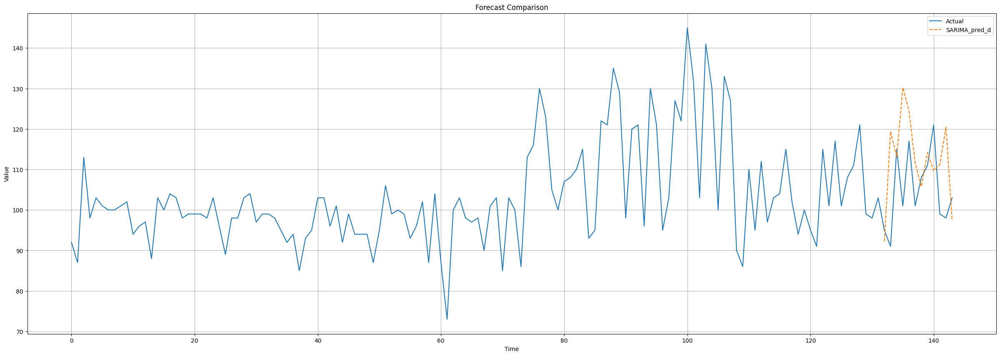

In [46]:


plt.figure(figsize=(30, 10))
plt.plot(df['Divorces'], label='Actual')


plt.plot(np.arange(len(train_d), len(train_d) + len(test_d)),SARIMA_pred_d, label='SARIMA_pred_d', linestyle='--')


plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

#**Analyzing the graph, it is clear that the trained SARIMA model does not perform well. Therefore, the previous model 1. and the conclusion about it turned out to be correct!**

##**2. c) I will visualise the time series for Married data. Use time series decomposition to extract the trend and seasonal components. Divide the data into train and test sets.**

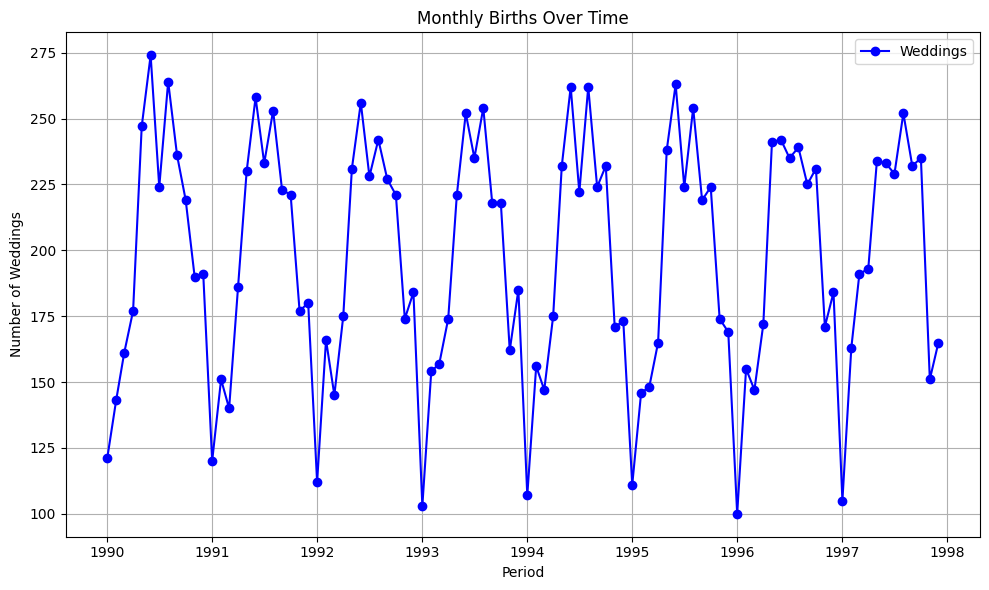

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd



plt.figure(figsize=(10, 6))
plt.plot(df['Period'], df['Merried'], marker='o', linestyle='-', color='b', label='Weddings')

# Formatting
plt.title('Monthly Births Over Time')
plt.xlabel('Period')
plt.ylabel('Number of Weddings')
plt.grid(True)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()


#Already on this graph you can see a stable trend and pronounced seasonality

##I will build a more convenient and visual chart

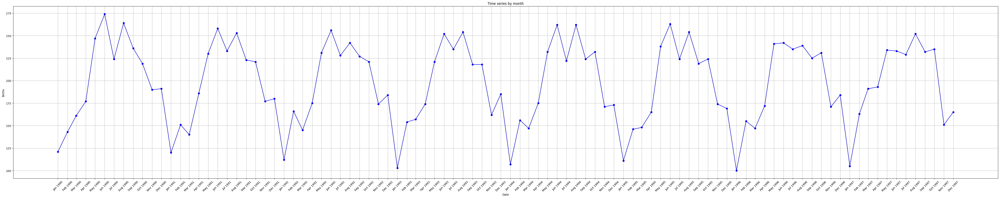

In [ ]:
import matplotlib.dates as mdates

plt.figure(figsize=(50, 10))
plt.plot(df['Period'], df['Merried'], marker='o', linestyle='-', color='b', label='Weddings')
plt.title('Time series by month')
plt.xlabel('Date')
plt.ylabel('Births')



plt.xticks(df['Period'], df['Period'].dt.strftime('%b %Y'), rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

plt.grid(True)
plt.tight_layout()
plt.show()

#**Now we can comfortably view all the data by analyzing the plot**
##Having studied the graph, we see seasonality: that in summer: June and August the highest Weddings rate; And January and March have the lowest Weddings rates.

##I will use time series decomposition to to extract the trend and seasonal components.

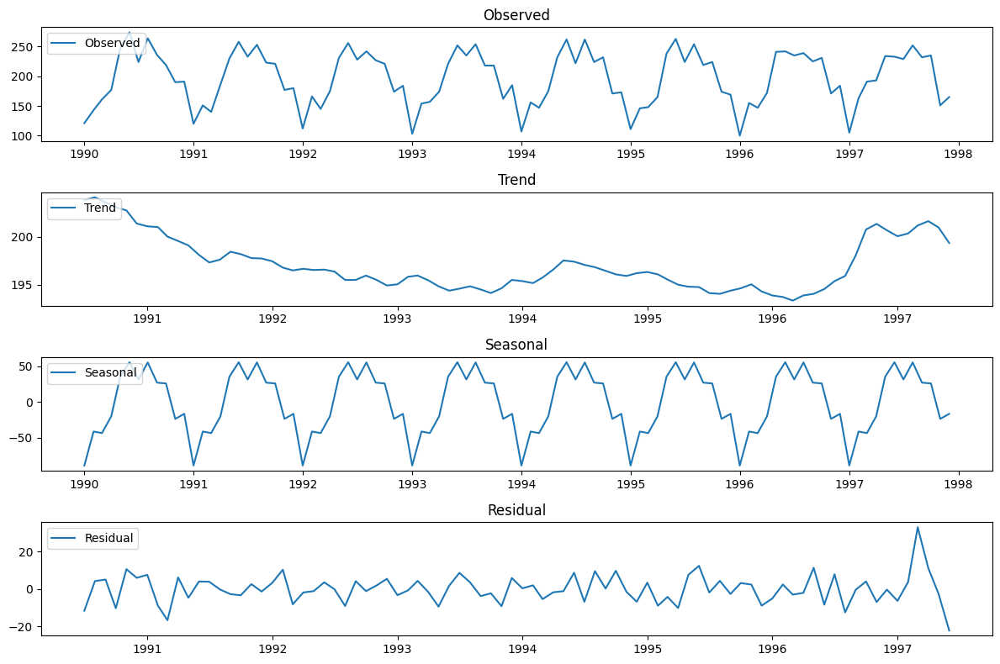

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose


result = seasonal_decompose(df['Merried'], model='additive', period=12)


plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(df['Period'], result.observed, label='Observed')
plt.legend(loc='upper left')
plt.title('Observed')

plt.subplot(412)
plt.plot(df['Period'], result.trend, label='Trend')
plt.legend(loc='upper left')
plt.title('Trend')

plt.subplot(413)
plt.plot(df['Period'], result.seasonal, label='Seasonal')
plt.legend(loc='upper left')
plt.title('Seasonal')

plt.subplot(414)
plt.plot(df['Period'], result.resid, label='Residual')
plt.legend(loc='upper left')
plt.title('Residual')

plt.tight_layout()
plt.show()

###And I also will use the STL function from statsmodels:

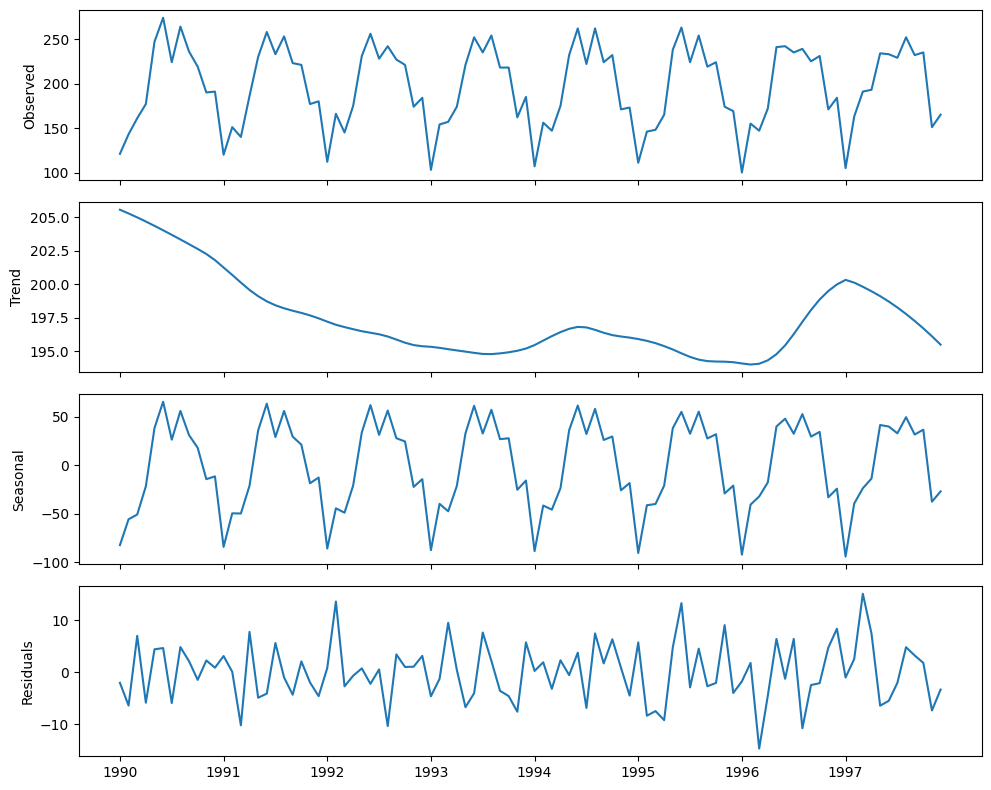

In [ ]:
from statsmodels.tsa.seasonal import STL
import numpy as np


decomposition = STL(df['Merried'], period=12).fit()


fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10, 8))

ax1.plot(decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(decomposition.resid)
ax4.set_ylabel('Residuals')

plt.xticks(np.arange(0, len(df), 12), df['Period'].dt.year.unique())

plt.tight_layout()
plt.show()

##1. The trend decreases from 1990 to 1993, until mid-1994 the trend was increasing. And then it decreases until 1996, from 1996 to 1997 there is a sharp increase, and from 1997 there is a decrease.

##2. Seasonal variations occur regularly, indicating that there are periodic factors influencing the data. The seasonal component shows regular fluctuations with clearly defined periodicity.

##3. Residual.The residuals fluctuate around zero, indicating that there is no significant trend or seasonal pattern in the residuals.

##**I will divide the data into train and test sets.**

In [51]:
train_size = int(len(df) * 0.8)
train_w = df['Merried'].iloc[:-12]
test_w = df['Merried'].iloc[-12:]

##**3. I will fit a SARIMA model.**

##**1. I'll check if the data is stationary.**

Run the ADF test and check if the process is stationary. If not, apply differencing.

I will use Augmented Dickey–Fuller (ADF) Test to check if the data is stationary.

The null hypothesis: there is a unit root present in a time series.

The augmented Dickey-Fuller (ADF) test helps us determine if a time series is stationary by testing for the presence of a unit root. If a unit root is present, the time series is not stationary.

In [ ]:
from statsmodels.tsa.stattools import adfuller


ADF_result = adfuller(df['Merried'])
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')


ADF Statistic: -2.4454443624011066
p-value: 0.12931856662356223



Conclusion: the dataset is **not** stationary.

##Differencing

In [ ]:
import numpy as np

diff_df=np.diff(df['Merried'], n=1)

In [ ]:
ADF_result = adfuller(diff_df)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -20.561575389961988
p-value: 0.0


###The dataset is stationary.

### let’s apply a seasonal difference and test for stationarity:

In [ ]:
df_diff_seasonal = np.diff(df['Merried'], n=12)
ADF_result = adfuller(df_diff_seasonal)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -8.818392490469433
p-value: 1.906552986940551e-14


This results in an ADF statistic of -8.818392490469433 and a
p-value of 1.906552986940551e-14. Stationary.


And order of integration (global) - 0

And order of integration (seasonal) - 1

In [ ]:
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
d = 0
D = 1
m = 12

In [ ]:
from itertools import product


SARIMA_order_list = list(product(ps, qs, Ps, Qs))
print(SARIMA_order_list)

[(0, 0, 0, 0), (0, 0, 0, 1), (0, 0, 0, 2), (0, 0, 0, 3), (0, 0, 1, 0), (0, 0, 1, 1), (0, 0, 1, 2), (0, 0, 1, 3), (0, 0, 2, 0), (0, 0, 2, 1), (0, 0, 2, 2), (0, 0, 2, 3), (0, 0, 3, 0), (0, 0, 3, 1), (0, 0, 3, 2), (0, 0, 3, 3), (0, 1, 0, 0), (0, 1, 0, 1), (0, 1, 0, 2), (0, 1, 0, 3), (0, 1, 1, 0), (0, 1, 1, 1), (0, 1, 1, 2), (0, 1, 1, 3), (0, 1, 2, 0), (0, 1, 2, 1), (0, 1, 2, 2), (0, 1, 2, 3), (0, 1, 3, 0), (0, 1, 3, 1), (0, 1, 3, 2), (0, 1, 3, 3), (0, 2, 0, 0), (0, 2, 0, 1), (0, 2, 0, 2), (0, 2, 0, 3), (0, 2, 1, 0), (0, 2, 1, 1), (0, 2, 1, 2), (0, 2, 1, 3), (0, 2, 2, 0), (0, 2, 2, 1), (0, 2, 2, 2), (0, 2, 2, 3), (0, 2, 3, 0), (0, 2, 3, 1), (0, 2, 3, 2), (0, 2, 3, 3), (0, 3, 0, 0), (0, 3, 0, 1), (0, 3, 0, 2), (0, 3, 0, 3), (0, 3, 1, 0), (0, 3, 1, 1), (0, 3, 1, 2), (0, 3, 1, 3), (0, 3, 2, 0), (0, 3, 2, 1), (0, 3, 2, 2), (0, 3, 2, 3), (0, 3, 3, 0), (0, 3, 3, 1), (0, 3, 3, 2), (0, 3, 3, 3), (1, 0, 0, 0), (1, 0, 0, 1), (1, 0, 0, 2), (1, 0, 0, 3), (1, 0, 1, 0), (1, 0, 1, 1), (1, 0, 1, 2), (1, 0

In [ ]:

import pandas as pd
from typing import Union
from tqdm import tqdm_notebook
from statsmodels.tsa.statespace.sarimax import SARIMAX
from itertools import product

def optimize_SARIMA(endog: Union[pd.Series, list], order_list: list, d: int, D: int, m: int) -> pd.DataFrame:
    results = []
    for order in tqdm_notebook(order_list, desc='Optimizing SARIMA'):
        try:
            model = SARIMAX(endog, order=(order[0], d, order[1]),
                            seasonal_order=(order[2], D, order[3], m),
                            enforce_stationarity=False,
                            enforce_invertibility=False,
                            simple_differencing=False).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except Exception as e:
            print(f"Error with order {order}: {e}")
            continue

    result_df = pd.DataFrame(results, columns=['(p, q, P, Q)', 'AIC'])


    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)

    return result_df




In [ ]:
SARIMA_statistic_w=optimize_SARIMA(train_w,SARIMA_order_list, d,D,m)

<ipython-input-46-2c22419d3f4b>:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list, desc='Optimizing SARIMA'):


Optimizing SARIMA:   0%|          | 0/256 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
print(SARIMA_statistic_w)

     (p, q, P, Q)         AIC
0    (0, 3, 3, 3)  226.998765
1    (1, 3, 3, 3)  228.509294
2    (0, 3, 1, 3)  229.934796
3    (3, 3, 2, 3)  230.660316
4    (0, 3, 2, 3)  231.148745
..            ...         ...
251  (2, 1, 0, 0)  513.766877
252  (2, 0, 0, 0)  515.313698
253  (1, 1, 0, 0)  515.348306
254  (1, 0, 0, 0)  520.379683
255  (0, 0, 0, 0)  520.511254

[256 rows x 2 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


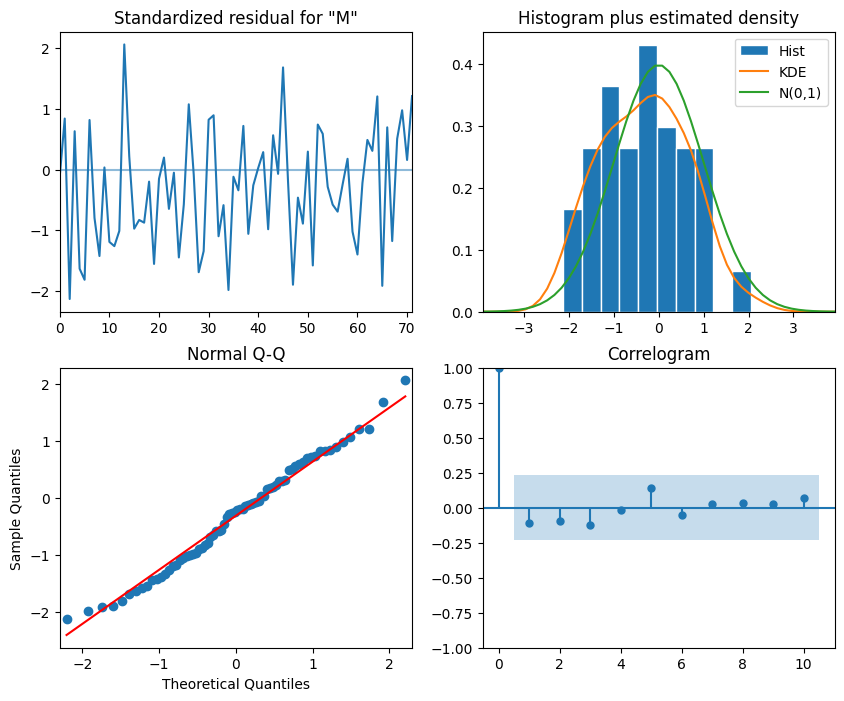

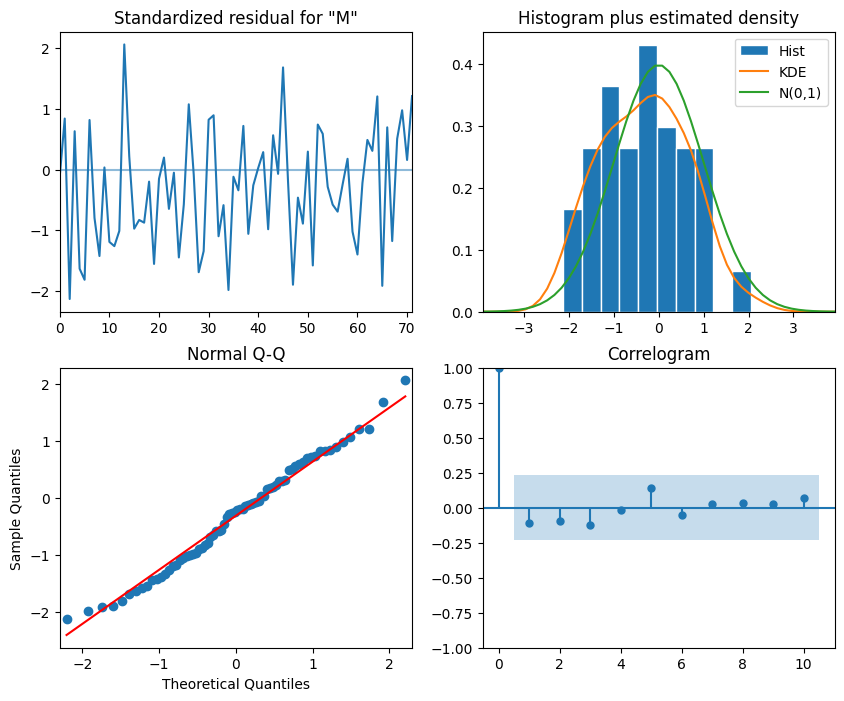

In [ ]:
#SARIMA(p,d,q)(P,D,Q)m, where m=12, d=0,D=1
# p=0,q=3,P=3,Q=3

SARIMA_model_w = SARIMAX(train_w, order=(0,0,3),seasonal_order=(3,1,3,12), simple_differencing=False)


SARIMA_model_fit_w = SARIMA_model_w.fit(disp=False)
SARIMA_model_fit_w.plot_diagnostics(figsize=(10,8))

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox


residuals = SARIMA_model_fit_w.resid
lb = acorr_ljungbox(residuals, np.arange(1, 11, 1))
print(lb)

       lb_stat     lb_pvalue
1    74.714347  5.439936e-18
2   140.322606  3.383243e-31
3   193.267841  1.201355e-41
4   234.195725  1.649250e-49
5   261.019556  2.372105e-54
6   277.756830  4.746399e-57
7   286.810703  3.956109e-58
8   290.637293  4.043175e-58
9   291.983857  1.307623e-57
10  292.315565  6.539202e-57


In [ ]:

SARIMA_pred_w = SARIMA_model_fit_w.get_prediction(85,96).predicted_mean


In [ ]:
print(SARIMA_pred_w)

85    157.728451
86    149.489312
87    170.545161
88    230.882634
89    246.948376
90    232.752677
91    244.764306
92    220.093887
93    226.446563
94    165.352723
95    179.941273
96     99.958583
Name: predicted_mean, dtype: float64


In [ ]:
def mape(y_true, y_pred):
 return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


mape_SARIMA = mape(SARIMA_pred_w,df['Merried'][-12:])

In [ ]:
mape_SARIMA

7.455842859174259

##We see that the trained SARIMA model performs good.

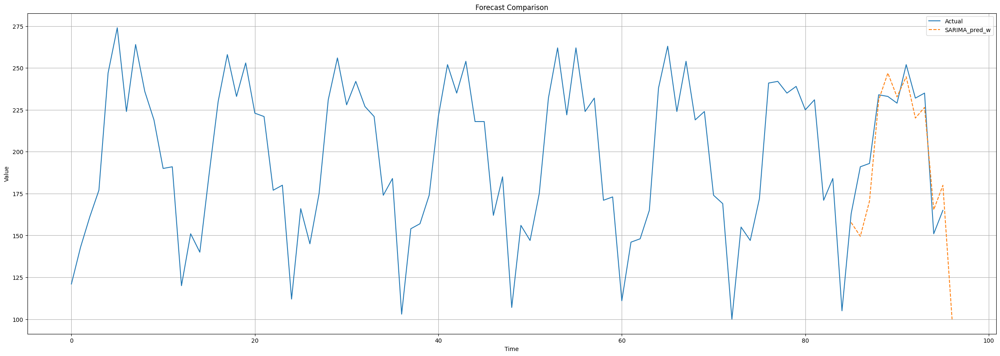

In [ ]:


plt.figure(figsize=(30, 10))
plt.plot(df['Merried'], label='Actual')


plt.plot(np.arange(len(train_b)+1, len(train_b) + len(test_b)+1),SARIMA_pred_w, label='SARIMA_pred_w', linestyle='--')


plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

##Having analyzed the graph, it is clear that the trained SARIMA model works well. And this model also takes into account trends and seasonality well. And having also analyzed all the graphs that were presented in the Married analysis, we also conclude that the SARIMA model works quite well for Married.

#**4.Would you think of external variables that have impact on any of the three series? Fit a SARIMAX model.**


##1. I studied research that about 20% of divorces in the United States occur within 1 year of marriage. I also learned from statistical data that in the world most first children in marriage are born in the first year of marriage.
##2. The number of births, in turn, can influence the number of divorces.
##3. The divorce rate probably does not directly affect the number of marriages, but it may affect the number of children born in the near future, because pregnancy can be a reason for divorce.

In [56]:
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)

SARIMAX_order_list = list(product(ps, qs, Ps, Qs))
print(SARIMA_order_list)

[(0, 0, 0, 0), (0, 0, 0, 1), (0, 0, 0, 2), (0, 0, 0, 3), (0, 0, 1, 0), (0, 0, 1, 1), (0, 0, 1, 2), (0, 0, 1, 3), (0, 0, 2, 0), (0, 0, 2, 1), (0, 0, 2, 2), (0, 0, 2, 3), (0, 0, 3, 0), (0, 0, 3, 1), (0, 0, 3, 2), (0, 0, 3, 3), (0, 1, 0, 0), (0, 1, 0, 1), (0, 1, 0, 2), (0, 1, 0, 3), (0, 1, 1, 0), (0, 1, 1, 1), (0, 1, 1, 2), (0, 1, 1, 3), (0, 1, 2, 0), (0, 1, 2, 1), (0, 1, 2, 2), (0, 1, 2, 3), (0, 1, 3, 0), (0, 1, 3, 1), (0, 1, 3, 2), (0, 1, 3, 3), (0, 2, 0, 0), (0, 2, 0, 1), (0, 2, 0, 2), (0, 2, 0, 3), (0, 2, 1, 0), (0, 2, 1, 1), (0, 2, 1, 2), (0, 2, 1, 3), (0, 2, 2, 0), (0, 2, 2, 1), (0, 2, 2, 2), (0, 2, 2, 3), (0, 2, 3, 0), (0, 2, 3, 1), (0, 2, 3, 2), (0, 2, 3, 3), (0, 3, 0, 0), (0, 3, 0, 1), (0, 3, 0, 2), (0, 3, 0, 3), (0, 3, 1, 0), (0, 3, 1, 1), (0, 3, 1, 2), (0, 3, 1, 3), (0, 3, 2, 0), (0, 3, 2, 1), (0, 3, 2, 2), (0, 3, 2, 3), (0, 3, 3, 0), (0, 3, 3, 1), (0, 3, 3, 2), (0, 3, 3, 3), (1, 0, 0, 0), (1, 0, 0, 1), (1, 0, 0, 2), (1, 0, 0, 3), (1, 0, 1, 0), (1, 0, 1, 1), (1, 0, 1, 2), (1, 0

In [ ]:
df

,Period,Live Birth,Merried,Divorces
0,1990-01-01,330,121,90
1,1990-02-01,316,143,86
2,1990-03-01,342,161,110
3,1990-04-01,330,177,95
4,1990-05-01,368,247,112
...,...,...,...,...
91,1997-08-01,341,252,93
92,1997-09-01,353,232,96
93,1997-10-01,329,235,102
94,1997-11-01,304,151,87


In [48]:
from typing import Union, List
import pandas as pd
from tqdm.notebook import tqdm
from statsmodels.tsa.statespace.sarimax import SARIMAX

def optimize_SARIMAX(endog: Union[pd.Series, list],
                     exog: Union[pd.Series, list],
                     order_list: List[tuple], d: int, D: int, m: int) -> pd.DataFrame:
    results = []
    for order in tqdm(order_list):
        try:
            model = SARIMAX(endog, exog=exog,
                            order=(order[0], d, order[1]),
                            seasonal_order=(order[2], D, order[3], m),
                            simple_differencing=False).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except:
            continue

    result_df = pd.DataFrame(results, columns=['(p,q,P,Q)', 'AIC'])
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    return result_df

1.I will аше SARIMAX for Live Birth

In [74]:
'''
In the previous steps this data was found
'''

d_b = 0
D_b = 1

In [75]:
exog_data_b= pd.concat([train_d, train_w], axis=1)
train_b=df['Live Birth'][:-12]
test_b=df['Live Birth'][-12:]

In [76]:
result_df_divorces = optimize_SARIMAX(train_b,exog_data_b, SARIMAX_order_list, d_b, D_b, m)

  0%|          | 0/256 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.p

In [77]:
result_df_divorces
#this is for Live Birth	, I mixed up the name, but this variable is not used further, so I didn’t retrain for the sake of just changing the name

,"(p,q,P,Q)",AIC
0,"(3, 3, 0, 1)",937.699342
1,"(3, 3, 0, 2)",939.762128
2,"(3, 3, 1, 1)",940.110294
3,"(3, 3, 3, 0)",940.852837
4,"(3, 3, 2, 1)",941.615849
...,...,...
249,"(0, 0, 2, 0)",1015.519263
250,"(0, 0, 0, 0)",1015.935804
251,"(0, 0, 0, 1)",1016.725981
252,"(0, 0, 1, 0)",1017.305310


In [78]:
best_model_b = SARIMAX(train_b, exog_data_b, order=(3,0,3),seasonal_order=(0,1,1,12), simple_differencing=False)

best_model_fit_b = best_model_b.fit(disp=False)
print(best_model_fit_b.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                      SARIMAX Results                                       
Dep. Variable:                           Live Birth   No. Observations:                  132
Model:             SARIMAX(3, 0, 3)x(0, 1, [1], 12)   Log Likelihood                -458.850
Date:                              Fri, 19 Jul 2024   AIC                            937.699
Time:                                      17:06:45   BIC                            965.574
Sample:                                           0   HQIC                           949.019
                                              - 132                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Divorces      -0.0277      0.092     -0.301      0.764      -0.208       0.153
Merried        0.18

#**SARIMAX Results analysis:**
1. Divorces: 0.1850 - The coefficient for the variable "Divorces" is positive, but insignificant (p-value 0.497). This means that there is no conclusive evidence of the impact of divorce on fertility.
2. Merried: 0.4380 - The coefficient for the "Merried" variable is significant (p-value 0.004), which indicates a significant positive effect on fertility.
3. ma.L1: -0.9998 - Coefficient for MA(1) component. The value is close to -1, but not significant (p-value 0.895), indicating that the time structure of the MA(1) component does not greatly influence the model.
4. ma.S.L12: -0.2180 - Coefficient for the seasonal MA(12) component. Not significant (p-value 0.070), indicating a weak influence of seasonality.
5. sigma2: 115.8437 - Estimation of noise variance in the model. Not significant (p-value 0.895), indicating greater uncertainty in the variance estimate.

**And now about Diagnostic tests:**
1. Ljung-Box (L1) (Q): 0.07 - Ljung-Box statistics value. A high p-value (0.80) indicates that there is no evidence of autocorrelation of the residuals.
2. Jarque-Bera (JB): 1.22 - Test for normal distribution of residuals. A high 3/p-value (0.54) indicates that the residuals are normally distributed.
3. Heteroskedasticity (H): 1.05 - Heteroskedasticity test. A high p-value (0.91) indicates the absence of heteroscedasticity.
4. Skew: 0.30 - Skewness coefficient close to 0, which indicates the symmetry of the distribution of residues.
5. Kurtosis: 3.21 - Kurtosis coefficient close to 3, indicating a normal distribution of residuals.

**Conclusion:** the model is trained quite well, but marriage data should be taken as exogenous data, because the Merried variable has a significant positive effect on fertility, while the effect of the Divorces variable is insignificant.

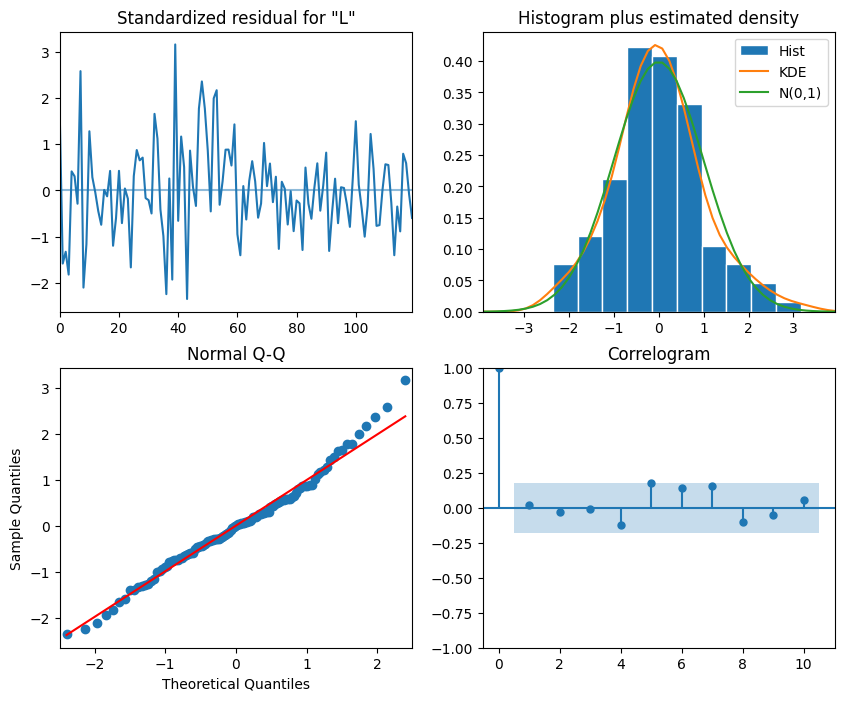

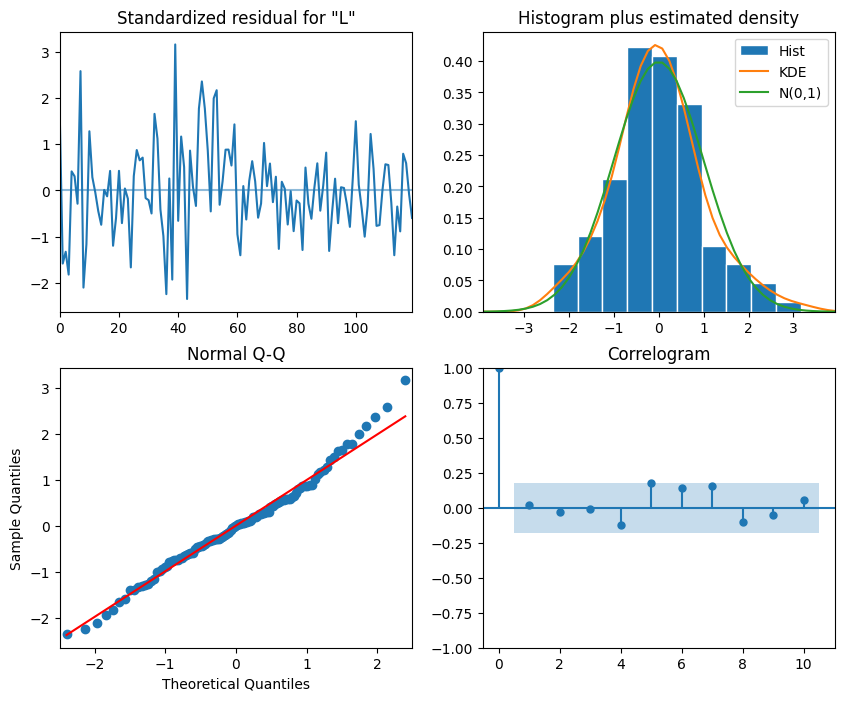

In [79]:
best_model_fit_b.plot_diagnostics(figsize=(10,8))

**Graph Analysis**:
1. **Standardized residual for "L"**

The standardized residuals plot shows that the residuals fluctuate around zero, which is good. There are no obvious trends or patterns, indicating that there are no systematic errors in the model.

2. **Histogram plus estimated density**

The histogram of the residuals shows that the distribution of the residuals is close to normal, as confirmed by the superimposed KDE curve and the normal distribution (N(0,1)).

3. **Normal Q-Q**

The Q-Q plot shows that the model residuals generally follow a straight line, indicating that the distribution of the residuals is normal. A few points deviate from the line, especially in the tails, which may indicate rare extreme values.

4. **Correlogram**

The residual correlogram shows the autocorrelation of the residuals. Most values ​​are within the confidence interval (blue area), indicating no significant autocorrelation. This confirms that the model explains the dependence of the data well and there are no significant autocorrelations in the residuals.


###As baseline models I will use Naive Seasonal Forecast and Moving Average Naive Forecast

In [250]:
from typing import Union, List
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

def rolling_forecast(endog: Union[pd.Series, list],
                     exog: Union[pd.DataFrame, pd.Series, list],
                     train_len: int, horizon: int, window: int,
                     method: str) -> List[float]:
    total_len = train_len + horizon
    if method == 'Seasonal':
        pred_last_value = []
        for i in range(train_len, total_len, window):
            last_value = endog[:i].iloc[-1]
            pred_last_value.extend(last_value for _ in range(window))
        return pred_last_value[:horizon]

    elif method == 'mean':
        pred_mean = []
        for i in range(train_len, total_len, window):
            mean_value = np.mean(endog[:i])
            pred_mean.extend([mean_value] * window)
        return pred_mean[:horizon]

In [251]:

train_len = 84
horizon = 12
window = 1
exog_test_b= pd.concat([test_d, test_w], axis=1)

forecast_Seasonal = rolling_forecast(train_b, exog_test_b, train_len, horizon, window, method='Seasonal')
print("Forecasting using 'Seasonal' method':")
print(forecast_Seasonal)


forecast_SARIMAX = best_model_fit_b.forecast(steps=horizon, exog=exog_test_b)
print("Forecasting using SARIMAX method:")
print(forecast_SARIMAX)

forecast_mean = rolling_forecast(train_b, exog_test_b, train_len, horizon, window, method='mean')
print("Forecasting using 'mean' method:")
print(forecast_mean)

Forecasting using 'Seasonal' method':
[356, 356, 338, 350, 346, 355, 349, 376, 373, 369, 359, 325]
Forecasting using SARIMAX method:
132    320.618172
133    311.101214
134    342.179737
135    328.914184
136    351.046690
137    346.023563
138    356.232943
139    349.754409
140    361.528748
141    351.759994
142    321.835566
143    343.878009
Name: predicted_mean, dtype: float64
Forecasting using 'mean' method:
[336.6190476190476, 336.84705882352944, 336.86046511627904, 337.01149425287355, 337.1136363636364, 337.314606741573, 337.44444444444446, 337.86813186813185, 338.25, 338.5806451612903, 338.79787234042556, 338.65263157894736]


In [82]:
def mape(y_true, y_pred):
 return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape_SARIMAX=mape(test_b,forecast_SARIMAX)



In [83]:
mape_SARIMAX

2.638381519677095

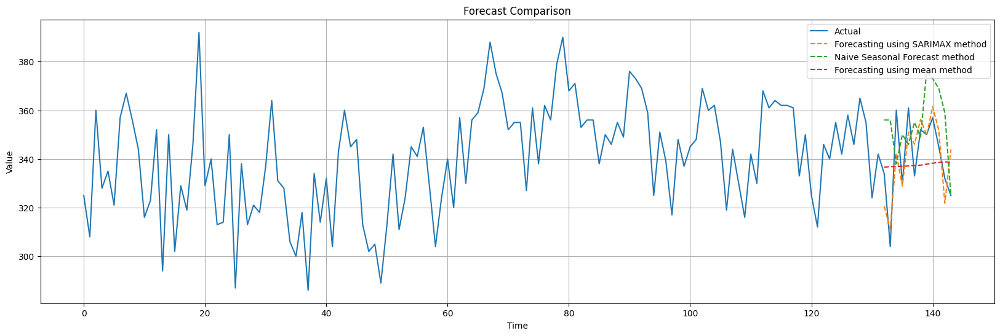

In [252]:
plt.figure(figsize=(20, 6))
plt.plot(df['Live Birth'], label='Actual')

plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),forecast_SARIMAX, label='Forecasting using SARIMAX method', linestyle='--')


plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),forecast_Seasonal, label='Naive Seasonal Forecast method', linestyle='--')


plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),forecast_mean, label='Forecasting using mean method', linestyle='--')

plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

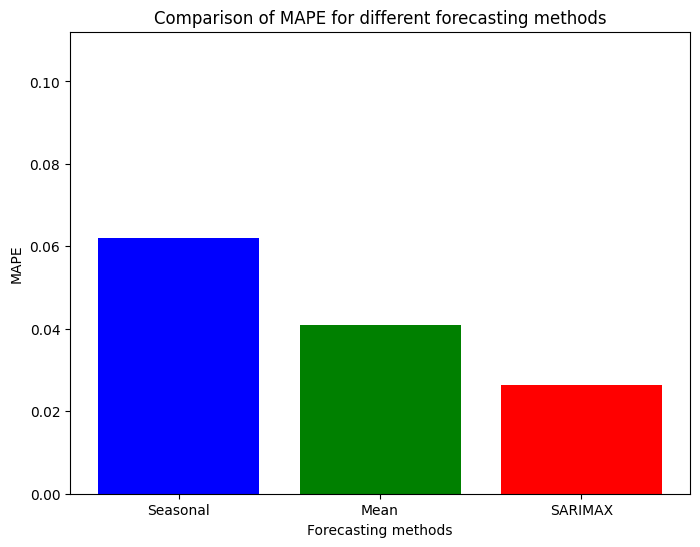

In [253]:
methods = ['Seasonal', 'Mean', 'SARIMAX']

mape_l=mape(test_b,forecast_Seasonal)
mape_m=mape(test_b,forecast_mean)

mape_values = [mape_l, mape_m, mape_SARIMAX]


plt.figure(figsize=(8, 6))
plt.bar(methods, mape_values, color=['blue', 'green', 'red'])
plt.xlabel('Forecasting methods')
plt.ylabel('MAPE')
plt.title('Comparison of MAPE for different forecasting methods')
plt.ylim(0, max(mape_values) + 0.05)
plt.show()

#And now, as exogenous data for SARIMAX model for natality, I’ll take data on marriages

In [59]:
train_b=df['Live Birth'][:-12]
result_df_b_1 = optimize_SARIMAX(train_b,train_w, SARIMAX_order_list, d_b, D_b, m)

  0%|          | 0/256 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:99

In [60]:
result_df_b_1

,"(p,q,P,Q)",AIC
0,"(2, 3, 0, 1)",929.650513
1,"(2, 3, 3, 0)",930.758192
2,"(3, 3, 0, 1)",931.423423
3,"(2, 3, 2, 2)",931.547989
4,"(2, 3, 0, 2)",931.593423
...,...,...
251,"(0, 0, 2, 0)",1006.739660
252,"(0, 0, 1, 0)",1009.286741
253,"(0, 0, 0, 3)",1012.342035
254,"(0, 0, 1, 3)",1012.936254


In [64]:
best_model_b_2 = SARIMAX(train_b, train_w, order=(2,0,3),seasonal_order=(0,1,1,12), simple_differencing=False)

best_model_fit_b_2 = best_model_b_2.fit(disp=False)
print(best_model_fit_b_2.summary())

                                      SARIMAX Results                                       
Dep. Variable:                           Live Birth   No. Observations:                  132
Model:             SARIMAX(2, 0, 3)x(0, 1, [1], 12)   Log Likelihood                -465.303
Date:                              Fri, 19 Jul 2024   AIC                            946.605
Time:                                      16:31:02   BIC                            968.905
Sample:                                           0   HQIC                           955.662
                                              - 132                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Merried        0.1866      0.070      2.659      0.008       0.049       0.324
ar.L1          0.81

#**SARIMAX Results analysis:**
1. Merried: A positive and significant coefficient (p-value < 0.05) indicates that the Merried variable (probably percentage married) has a positive effect on the number of live births.
2. ar.L1 and ar.L2: The first lagged AR value (autoregression) is significant (p-value < 0.05), the second is not.
3. ma.L1, ma.L2 and ma.L3: All three MA (moving average) coefficients are significant, indicating the presence of complex timing in the data.
4. ma.S.L12: The seasonal moving average is also significant, confirming the seasonal component in the data.

**And now about Diagnostic tests:**
1. Ljung-Box (L1) (Q): 0.02 - Ljung-Box statistics for testing autocorrelation of residuals. The value Prob(Q) = 0.90 (more than 0.05) indicates the absence of significant autocorrelation in the residuals.
2. Jarque-Bera (JB): 2.13 - test for normality of residuals. A value of Prob(JB) = 0.34 (greater than 0.05) suggests that the residuals are normally distributed.


**Conclusion:** This SARIMAX model is well suited for modeling the time series of live births, taking into account both autocorrelation and seasonal effects, as well as the influence of an external variable (Merried).

In [93]:
forecast_SARIMAX_2 = best_model_fit_b_2.forecast(steps=12, exog=test_w)
print("Forecasting using SARIMAX method:")
print(forecast_SARIMAX_2)

Forecasting using SARIMAX method:
132    320.633142
133    311.579489
134    339.541268
135    330.655003
136    352.589658
137    343.854834
138    357.616606
139    350.556154
140    360.277138
141    352.746840
142    322.416486
143    342.871061
Name: predicted_mean, dtype: float64


In [94]:
mape_SARIMAX_2 = mape(test_b,forecast_SARIMAX_2)

In [95]:
print(mape_SARIMAX_2)

2.6057967347688034


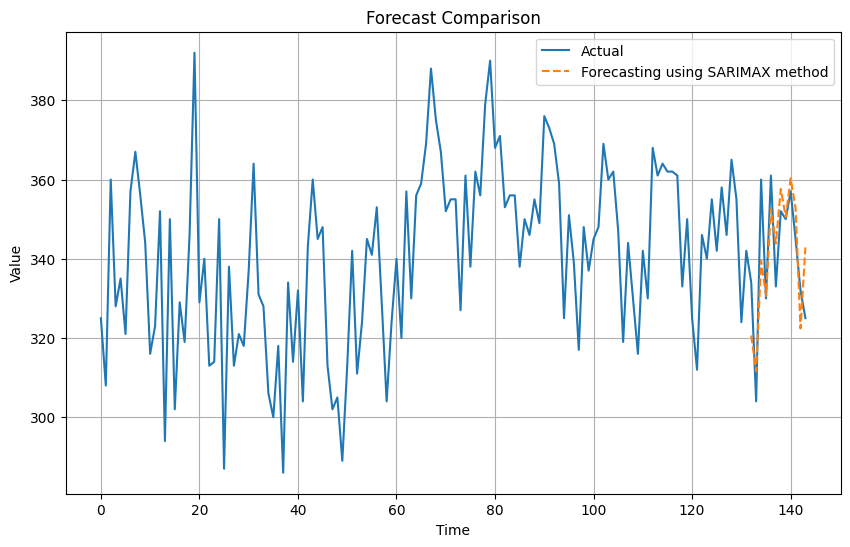

In [96]:
plt.figure(figsize=(10, 6))
plt.plot(df['Live Birth'], label='Actual')

plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),forecast_SARIMAX_2, label='Forecasting using SARIMAX method', linestyle='--')

plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

#**Great!**
#Looking at the graph, it is clear that this SARIMAX model with data on the number of weddings as exogenous data works very well. It takes into account exogenous data, and in addition to this, it also takes into account seasonality and trend!

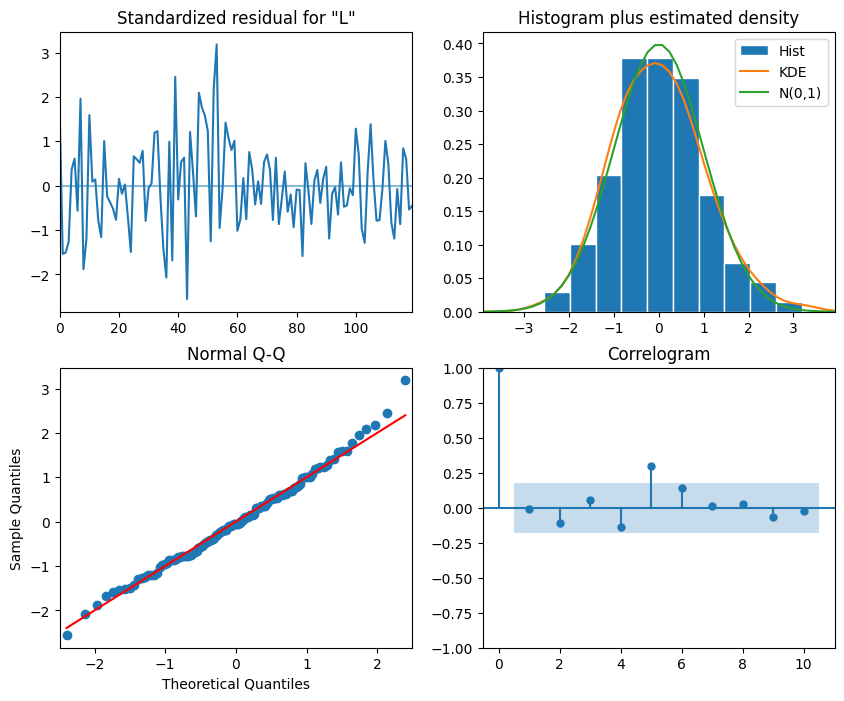

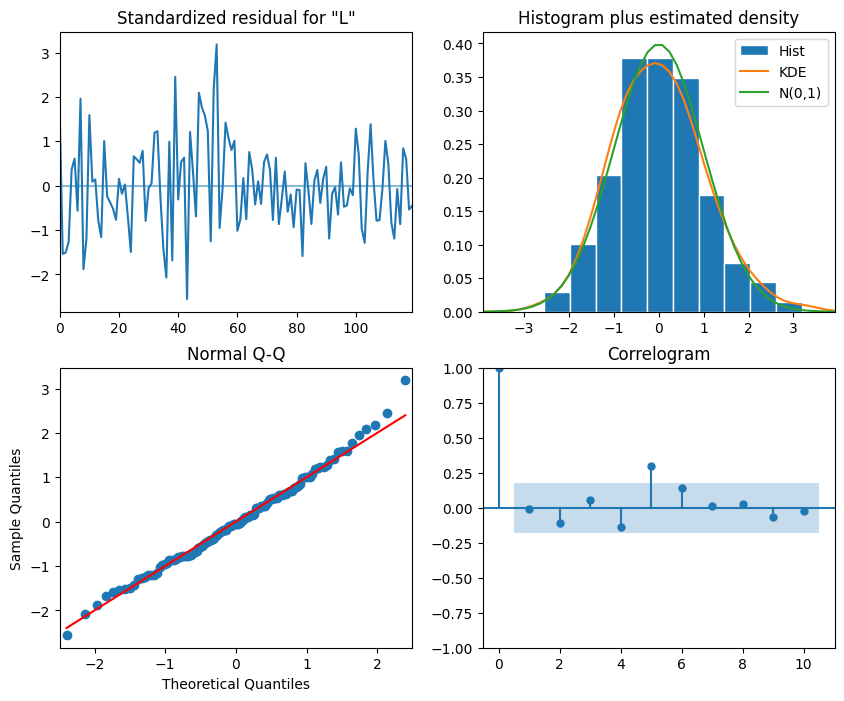

In [97]:
best_model_fit_b_2.plot_diagnostics(figsize=(10,8))

#**Graph Analysis**:
##1. **Standardized residual for "L"**

##The residuals are distributed around zero, which is a good sign indicating the absence of systematic errors.
##There are no obvious trends or patterns, indicating that the model effectively captured the temporal structure of the data.
##However, there are some extreme values ​​(peaks) that may indicate anomalies or outliers.

##2. **Histogram plus estimated density**

#3The histogram of the residuals is close to the normal distribution, but there are slight deviations.
##The green curve (normal distribution) and the orange curve (KDE) match fairly well, indicating an approximately normal distribution of the residuals.
##The presence of some asymmetry and peaks in extreme values ​​may indicate possible deviations from normality.

##3. **Normal Q-Q**

##Most of the points lie on a straight line, which confirms the normal distribution of residuals.
##Several points at the ends deviate from the line, indicating possible outliers or deviations in the tails of the distribution.

##4. **Correlogram**

##Most lags fall within the confidence interval (blue bars), indicating no significant autocorrelation.
##The first lag has significant autocorrelation, but the remaining lags are within normal limits, which confirms the **adequacy** of the model in capturing time dependencies.


#**RESULT:** the latest SARIMAX trained model works well, and the exogenous data is also well selected, as indicated by all the graphs analyzed above, as well as the SARIMAX Results analysis.

#**5. Is there inter-dependance between any of these three time series? If not, try to find another time series that is inter-dependant with the number of births, for example. Fit a VARMAX model**

#I will build 3 time series charts on a single chart.

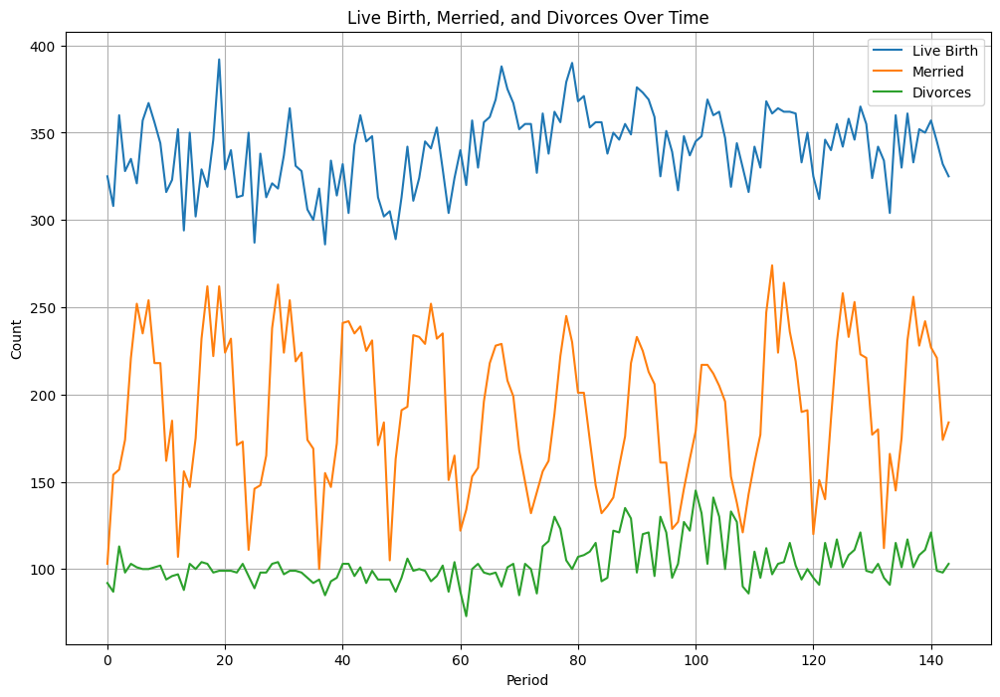

In [98]:

plt.figure(figsize=(12, 8))
plt.plot(df.index, df['Live Birth'], label='Live Birth')
plt.plot(df.index, df['Merried'], label='Merried')
plt.plot(df.index, df['Divorces'], label='Divorces')

plt.title('Live Birth, Merried, and Divorces Over Time')
plt.xlabel('Period')
plt.ylabel('Count')
plt.legend()
plt.grid(True)
plt.show()

##From this graph it is clear that there is a relationship between data on marriages and data on the birth of children (+ this fact was already confirmed when training the SARIMAX model). Therefore, let's find the correlation between these data sets.

Correlation between Merried and Live Birth: 0.37206189191443134


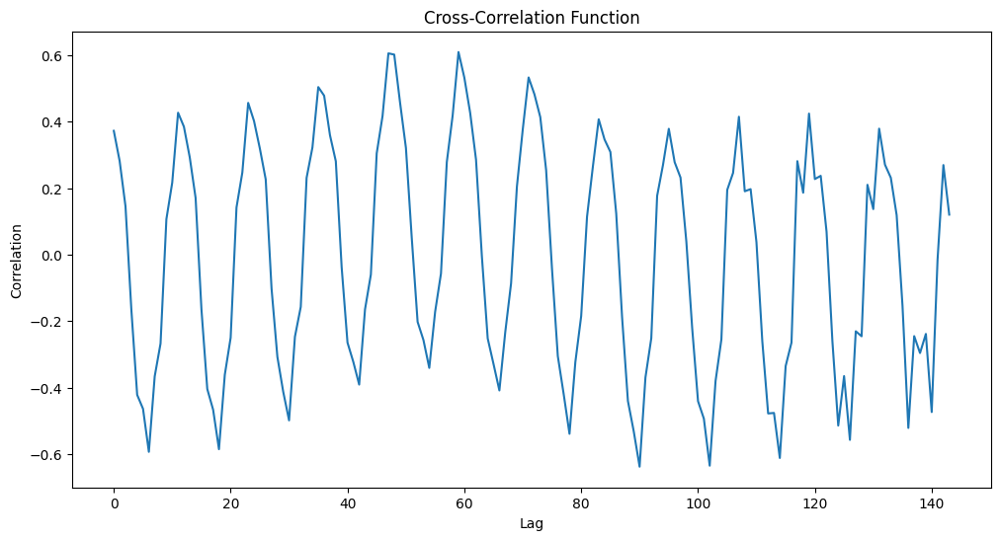

In [101]:
import seaborn as sns
from statsmodels.tsa.stattools import ccf

correlation = df['Merried'].corr(df['Live Birth'])
print(f"Correlation between Merried and Live Birth: {correlation}")

cross_corr = ccf(df['Merried'], df['Live Birth'])
plt.figure(figsize=(12, 6))
plt.plot(cross_corr)
plt.title('Cross-Correlation Function')
plt.xlabel('Lag')
plt.ylabel('Correlation')
plt.show()

###At the top of the graph is the correlation value between the two time series: 0.37206189191443134. This value indicates a moderate positive correlation between these variables.
###High Correlation: At some lags the correlation values ​​reach 0.6, indicating a strong positive relationship between Merried and Live Birth at these lags.
###Low correlation: At other lags, the correlation values ​​reach -0.6, which indicates a strong negative relationship between the variables at these lags.

Looking at time series graphs and studying US statistics, it is clear that the number of children born directly depends on the number of marriages. So yes, there are interdependent parameters in my data

In [102]:
from statsmodels.tsa.statespace.varmax import VARMAX
def optimize_VAR(endog: Union[pd.DataFrame, list]) -> pd.DataFrame:
    results = []
    for i in tqdm_notebook(range(1, 15)):  # Start from 1 to avoid zero order
        try:
            model = VARMAX(endog, order=(i, 0)).fit(disp=False)
            aic = model.aic
            results.append([i, aic])
        except Exception as e:
            print(f"Order {i} failed with error: {e}")
            continue
    result_df = pd.DataFrame(results, columns=['p', 'AIC'])
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    return result_df

#**1.**

In [133]:
from statsmodels.tsa.stattools import grangercausalitytests

endog = pd.concat([train_b, train_w], axis=1)

#Because the data were analyzed for stationarity in the previous steps, then we immediately know that the order of differentiation is 1 in both cases.
endog_diff = endog.diff()[1:]



train = endog_diff[:-12]
test = endog_diff[12:]


result_df = optimize_VAR(train)

<ipython-input-102-9f0121afe90c>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(1, 15)):  # Start from 1 to avoid zero order


  0%|          | 0/14 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

In [107]:
result_df

,p,AIC
0,13,1972.581958
1,14,1973.425391
2,12,1974.829760
3,11,1988.808741
4,9,2020.096002
5,10,2023.450919
6,8,2046.524863
7,7,2082.109436
8,6,2087.354614
9,5,2104.395203


In [177]:
endog_new_3 = pd.concat([train_w,train_b], axis=1)
endog_diff = endog_new_3.diff()[1:]

In [178]:

train = endog_diff[:-12]
test = endog_diff[12:]

In [179]:
result_df = optimize_VAR(train)

<ipython-input-102-9f0121afe90c>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(1, 15)):  # Start from 1 to avoid zero order


  0%|          | 0/14 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

In [180]:
result_df

,p,AIC
0,13,1972.185148
1,14,1973.222625
2,12,1975.034887
3,11,1989.707277
4,9,2020.338997
5,10,2023.532690
6,8,2046.427662
7,7,2082.054028
8,6,2087.311600
9,5,2104.374637


In [192]:
df

,Period,Live Birth,Merried,Divorces
0,January 1993,325,103,92
1,February 1993,308,154,87
2,March 1993,360,157,113
3,April 1993,328,174,98
4,May 1993,335,221,103
...,...,...,...,...
139,August 1992,350,242,111
140,September 1992,357,227,121
141,October 1992,345,221,99
142,November 1992,332,174,98


In [193]:
df_diff = df[['Live Birth', 'Merried']].diff()

In [194]:

df_diff = df[['Live Birth', 'Merried']].diff()


nan_rows = df_diff[df_diff.isna().any(axis=1)]

print("Rows with NaN values:")
print(nan_rows.index)


Rows with NaN values:
Index([0], dtype='int64')


In [196]:
granger_1 =grangercausalitytests(df[['Live Birth','Merried']].diff()[1:], [13])
granger_2 =grangercausalitytests(df[['Merried','Live Birth']].diff()[1:], [13])


Granger Causality
number of lags (no zero) 13
ssr based F test:         F=3.3863  , p=0.0002  , df_denom=103, df_num=13
ssr based chi2 test:   chi2=55.5623 , p=0.0000  , df=13
likelihood ratio test: chi2=46.2613 , p=0.0000  , df=13
parameter F test:         F=3.3863  , p=0.0002  , df_denom=103, df_num=13

Granger Causality
number of lags (no zero) 13
ssr based F test:         F=1.3534  , p=0.1952  , df_denom=103, df_num=13
ssr based chi2 test:   chi2=22.2068 , p=0.0522  , df=13
likelihood ratio test: chi2=20.5017 , p=0.0834  , df=13
parameter F test:         F=1.3534  , p=0.1952  , df_denom=103, df_num=13


#**2.**

In [190]:
endog = pd.concat([train_d, train_w], axis=1)

#Because the data were analyzed for stationarity in the previous steps, then we immediately know that the order of differentiation is 1 in both cases.
endog_diff = endog.diff()[1:]



train = endog_diff[:-12]
test = endog_diff[12:]


result_df = optimize_VAR(train)

<ipython-input-102-9f0121afe90c>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(1, 15)):  # Start from 1 to avoid zero order


  0%|          | 0/14 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

In [198]:
result_df

,p,AIC
0,14,1871.697153
1,12,1873.843891
2,13,1874.578844
3,11,1893.027741
4,10,1939.917007
5,9,1943.205080
6,8,1972.935088
7,7,2000.987518
8,6,2018.634566
9,5,2024.041510


In [199]:
granger_1 =grangercausalitytests(df[['Divorces','Merried']].diff()[1:], [14])
granger_2 =grangercausalitytests(df[['Merried','Divorces']].diff()[1:], [14])


Granger Causality
number of lags (no zero) 14
ssr based F test:         F=0.9392  , p=0.5204  , df_denom=100, df_num=14
ssr based chi2 test:   chi2=16.9628 , p=0.2582  , df=14
likelihood ratio test: chi2=15.9366 , p=0.3173  , df=14
parameter F test:         F=0.9392  , p=0.5204  , df_denom=100, df_num=14

Granger Causality
number of lags (no zero) 14
ssr based F test:         F=2.0347  , p=0.0222  , df_denom=100, df_num=14
ssr based chi2 test:   chi2=36.7460 , p=0.0008  , df=14
likelihood ratio test: chi2=32.3331 , p=0.0036  , df=14
parameter F test:         F=2.0347  , p=0.0222  , df_denom=100, df_num=14


We have a p-value whose value is greater than 0.05, so we need to take and examine the following data

#**3.**

In [200]:
endog = pd.concat([train_d, train_b], axis=1)

#Because the data were analyzed for stationarity in the previous steps, then we immediately know that the order of differentiation is 1 in both cases.
endog_diff = endog.diff()[1:]



train = endog_diff[:-12]
test = endog_diff[12:]


result_df = optimize_VAR(train)

<ipython-input-102-9f0121afe90c>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(1, 15)):  # Start from 1 to avoid zero order


  0%|          | 0/14 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

In [201]:
result_df

,p,AIC
0,14,1856.210972
1,13,1862.331747
2,12,1867.209280
3,11,1876.132288
4,10,1916.217583
5,9,1923.090036
6,7,1924.029282
7,8,1924.581816
8,6,1934.136124
9,5,1940.081573


In [203]:
granger_1 =grangercausalitytests(df[['Divorces','Live Birth']].diff()[1:], [14])
granger_2 =grangercausalitytests(df[['Live Birth','Divorces']].diff()[1:], [14])


Granger Causality
number of lags (no zero) 14
ssr based F test:         F=1.9433  , p=0.0303  , df_denom=100, df_num=14
ssr based chi2 test:   chi2=35.0959 , p=0.0014  , df=14
likelihood ratio test: chi2=31.0424 , p=0.0055  , df=14
parameter F test:         F=1.9433  , p=0.0303  , df_denom=100, df_num=14

Granger Causality
number of lags (no zero) 14
ssr based F test:         F=0.9103  , p=0.5504  , df_denom=100, df_num=14
ssr based chi2 test:   chi2=16.4394 , p=0.2873  , df=14
likelihood ratio test: chi2=15.4732 , p=0.3466  , df=14
parameter F test:         F=0.9103  , p=0.5504  , df_denom=100, df_num=14


We have a p-value whose value is greater than 0.05, so we need to take and examine the following data

Unfortunately,there is no freely available data that is interdependent, has the same order of differentiation and has monthly data, since the factors that may influence births, marriages or divorces are highly specific and confidential and therefore countries do not provide them. .

#The smallest (best) p values ​​were obtained on data with the number of children born and the number of weddings + they have a fairly good correlation coefficient.



In [204]:
endog_new_3 = pd.concat([train_w,train_b], axis=1)
endog_diff = endog_new_3.diff()[1:]
train = endog_diff[:-12]
test = endog_diff[12:]

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


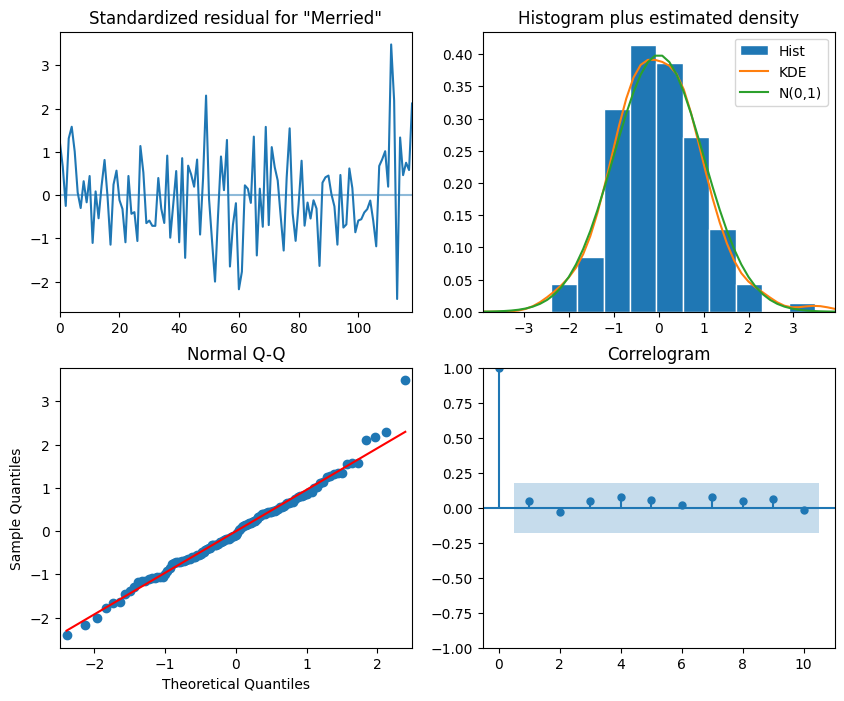

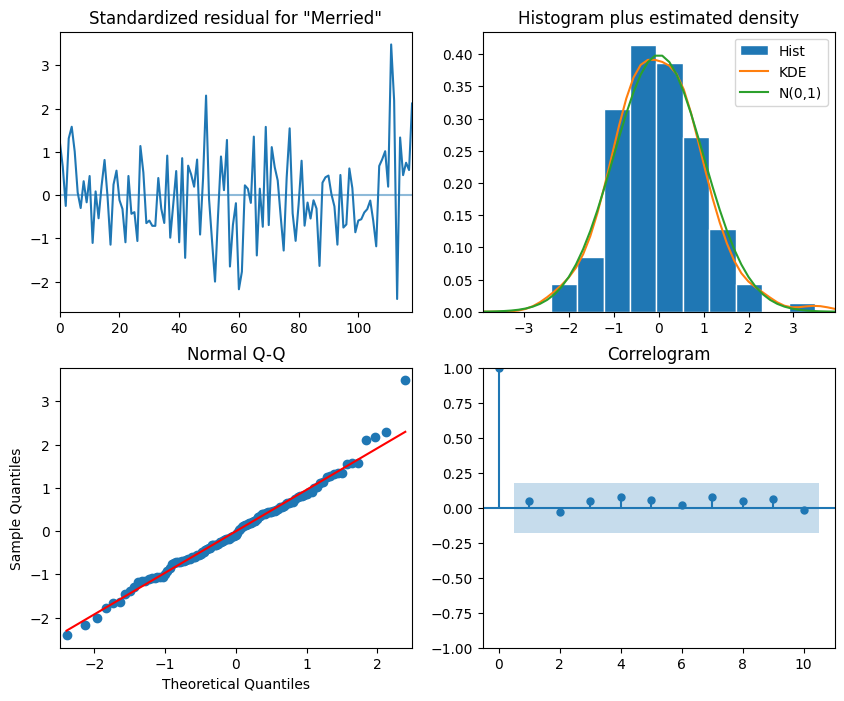

In [205]:

best_model = VARMAX(train, order=(13,0))
best_model_fit = best_model.fit(disp=False)
best_model_fit.plot_diagnostics(figsize=(10,8),
variable=0)

In [210]:
forecast = best_model_fit.get_forecast(steps=12)

forecasted_values_VARMAX = forecast.predicted_mean

print(forecasted_values_VARMAX)

       Merried  Live Birth
120 -47.099705  -13.595531
121  32.598954  -12.150335
122  15.576236   28.723685
123  19.110194  -16.033236
124  40.279298   29.859653
125  18.910912  -14.584642
126 -26.995717   14.936516
127  30.856584   -0.404019
128 -28.655453   -4.585552
129 -20.119396   -1.151852
130 -28.238664  -23.142332
131  -5.757636    2.675657


###Now I’ll restore the data after differentiation

In [211]:
last_known_values = endog_new_3.iloc[-1]

# Restore predicted values
forecasted_values_cumsum = forecasted_values_VARMAX.cumsum()
restored_forecasted_values_VARMAX = forecasted_values_cumsum + last_known_values

print(restored_forecasted_values_VARMAX)

        Merried  Live Birth
120  132.900295  328.404469
121  165.499249  316.254134
122  181.075485  344.977819
123  200.185679  328.944583
124  240.464977  358.804236
125  259.375889  344.219594
126  232.380172  359.156110
127  263.236756  358.752091
128  234.581302  354.166539
129  214.461906  353.014687
130  186.223243  329.872355
131  180.465606  332.548012


In [215]:
print(mean_squared_error(restored_forecasted_values_VARMAX['Merried'],test_w))

267.1768872270605


In [216]:
print(mean_squared_error(restored_forecasted_values_VARMAX['Live Birth'],test_b))

66.71052935324742


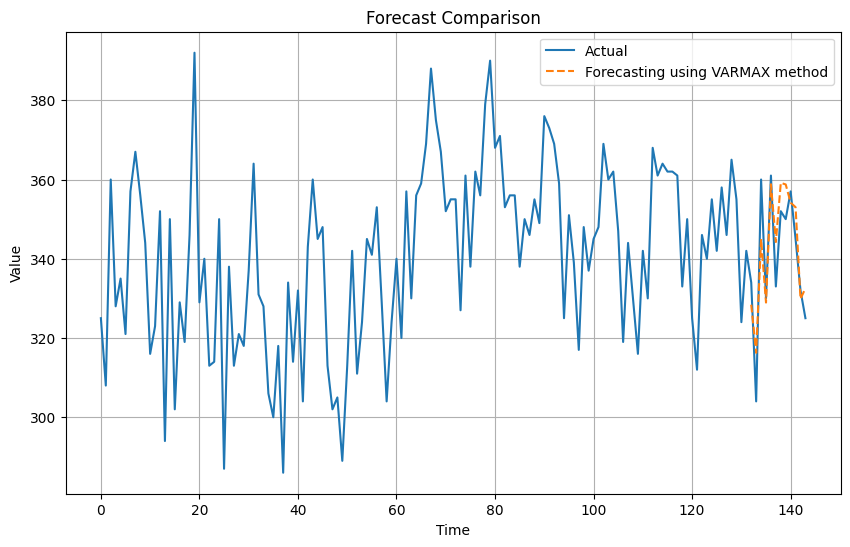

In [217]:
plt.figure(figsize=(10, 6))
plt.plot(df['Live Birth'], label='Actual')

plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),restored_forecasted_values_VARMAX['Live Birth'], label='Forecasting using VARMAX method', linestyle='--')

plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

#Having studied the graph, it is clear that the model also predicts quite well, maintaining the trend and seasonality.

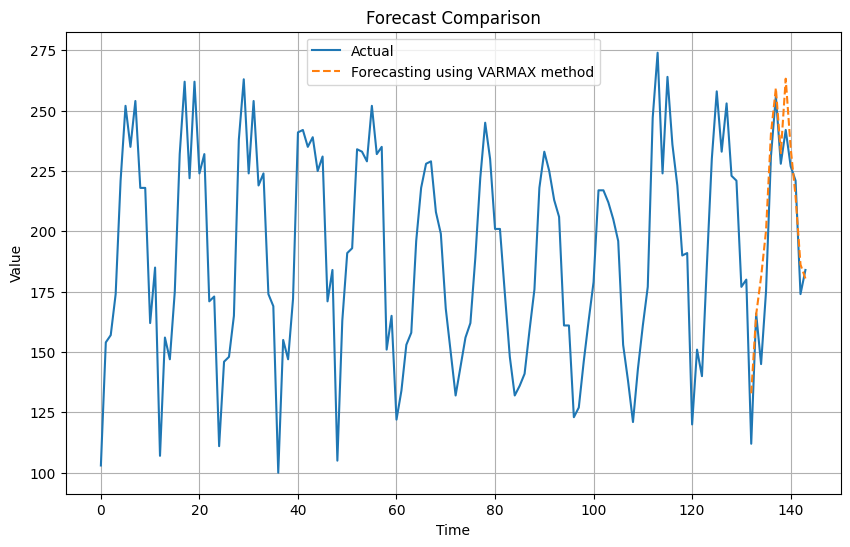

In [218]:
plt.figure(figsize=(10, 6))
plt.plot(df['Merried'], label='Actual')

plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),restored_forecasted_values_VARMAX['Merried'], label='Forecasting using VARMAX method', linestyle='--')

plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

#Having studied the graph, it is clear that the model also predicts quite well, maintaining the trend and seasonality.

#6.Choose and apply two baseline models.

#Two baselines were trained in the previous steps

#7. Make forecasts and plot them.

#All forecasting graphs were constructed and analyzed immediately after working with a specific model in the previous stages. And a comparative analysis of all models will be at stage 8).

#8. Make conclusions.Compare the performance of the developed models: baselines, SARIMA, SARIMAX and VARMAX. Select an appropriate error metric.



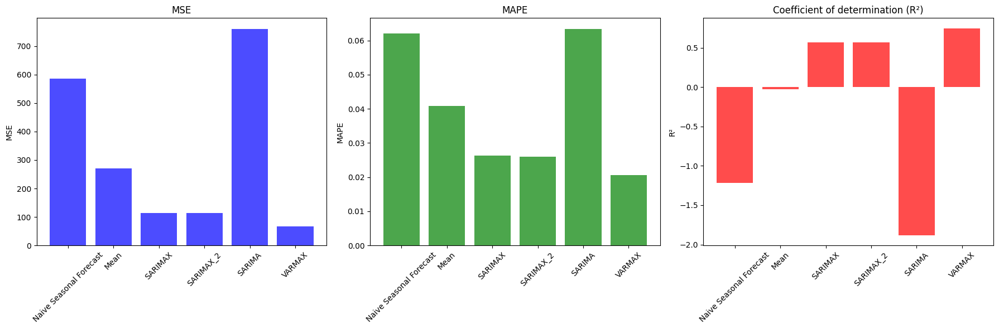

In [254]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

# Define r_squared function
def r_squared(y_true, y_pred):
    return r2_score(y_true, y_pred)

# Define mape function
def mape(y_true, y_pred):
    return mean_absolute_percentage_error(y_true, y_pred)

# Compute MSE
mse_last = mean_squared_error(test_b, forecast_Seasonal)
mse_mean = mean_squared_error(test_b, forecast_mean)
mse_sarimax = mean_squared_error(test_b, forecast_SARIMAX)
mse_sarimax_2 = mean_squared_error(test_b, forecast_SARIMAX_2)
mse_SARIMA = mean_squared_error(test_b, SARIMA_pred_b)
mse_VARMAX = mean_squared_error(test_b, restored_forecasted_values_VARMAX['Live Birth'])

# Compute R²
r2_last = r_squared(test_b, forecast_Seasonal)
r2_mean = r_squared(test_b, forecast_mean)
r2_sarimax = r_squared(test_b, forecast_SARIMAX)
r2_sarimax_2 = r_squared(test_b, forecast_SARIMAX_2)
r2_SARIMA = r_squared(test_b, SARIMA_pred_b)
r2_VARMAX = r_squared(test_b, restored_forecasted_values_VARMAX['Live Birth'])

# Compute MAPE
mape_last = mape(test_b, forecast_Seasonal)
mape_mean = mape(test_b, forecast_mean)
mape_SARIMAX = mape(test_b, forecast_SARIMAX)
mape_SARIMAX_2 = mape(test_b, forecast_SARIMAX_2)
mape_SARIMA = mape(test_b, SARIMA_pred_b)
mape_VARMAX = mape(test_b, restored_forecasted_values_VARMAX['Live Birth'])

# Prepare data for plotting
mse_values = [mse_last, mse_mean, mse_sarimax, mse_sarimax_2, mse_SARIMA, mse_VARMAX]
r2_values = [r2_last, r2_mean, r2_sarimax, r2_sarimax_2, r2_SARIMA, r2_VARMAX]
mape_values = [mape_last, mape_mean, mape_SARIMAX, mape_SARIMAX_2, mape_SARIMA, mape_VARMAX]
labels = ['Naive Seasonal Forecast', 'Mean', 'SARIMAX', 'SARIMAX_2', 'SARIMA', 'VARMAX']

# Function to plot metrics
def plot_metrics(mse_values, mape_values, r2_values, labels):
    x = np.arange(len(labels))

    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    # MSE
    ax[0].bar(x, mse_values, color='blue', alpha=0.7)
    ax[0].set_xticks(x)
    ax[0].set_xticklabels(labels, rotation=45)
    ax[0].set_title('MSE')
    ax[0].set_ylabel('MSE')

    # MAPE
    ax[1].bar(x, mape_values, color='green', alpha=0.7)
    ax[1].set_xticks(x)
    ax[1].set_xticklabels(labels, rotation=45)
    ax[1].set_title('MAPE')
    ax[1].set_ylabel('MAPE')

    # R²
    ax[2].bar(x, r2_values, color='red', alpha=0.7)
    ax[2].set_xticks(x)
    ax[2].set_xticklabels(labels, rotation=45)
    ax[2].set_title('Coefficient of determination (R²)')
    ax[2].set_ylabel('R²')

    plt.tight_layout()
    plt.show()

# Plot the metrics
plot_metrics(mse_values, mape_values, r2_values, labels)


In [233]:
print(r2_VARMAX)

0.7473285402859721


In [239]:
mape_SARIMAX>mape_SARIMAX_2


True

In [247]:
r2_sarimax_2 >r2_sarimax

True

In [246]:
mse_sarimax>mse_sarimax_2

True

##I will build a general graph with all the models and their predictions

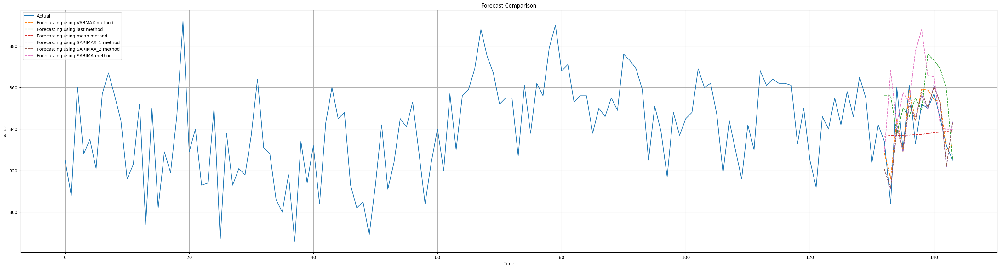

In [255]:
plt.figure(figsize=(40, 10))
plt.plot(df['Live Birth'], label='Actual')

plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),restored_forecasted_values_VARMAX['Live Birth'], label='Forecasting using VARMAX method', linestyle='--')
plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),forecast_Seasonal, label='Forecasting using last method', linestyle='--')
plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),forecast_mean, label='Forecasting using mean method', linestyle='--')
plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),forecast_SARIMAX, label='Forecasting using SARIMAX_1 method', linestyle='--')
plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),forecast_SARIMAX_2, label='Forecasting using SARIMAX_2 method', linestyle='--')
plt.plot(np.arange(len(train_b), len(train_b) + len(test_b)),SARIMA_pred_b, label='Forecasting using SARIMA method', linestyle='--')


plt.title('Forecast Comparison')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

#Having studied the diagrams and graph, it is clear that the VARMAX model works best: it has the smallest MSE and MAPE values, but the highest coefficient on R², which indicates that the model best explains the variability of the data. And besides this, it also perfectly explains the variability of the data: R²=0.7473285402859721.
#SARIMAX and SARIMAX_2 both work quite well, but the SARIMAX_2 model performs better than SARIMAX in all 3 error metrics.

#**RESULT:**

#1. VARMAX is the best model.
#2. SARIMAX_2 model
#3. SARIMAX model
#Baselines:
-----------------------
#4. Mean-method model
#5. Naive Seasonal Forecast model
-----------------------
#6. SARIMA model

#**BUT**
#However, it is important to note that SARIMA has retained seasonality and trend and its predictions are much more useful than the Naive Seasonal Forecast model  model predictions and the Mean-method model!

#**Result:**
##1. About the data:
###1. Natality data for the period 2003 - May 2024 in the USA was found, downloaded from the official US website and analyzed.
###2. I also found data on the number of marriages and divorces in official US statistical journals. Data on the number of marriages was provided by month, data on the number of divorces was provided by month by state, and for the correct collection of divorce data, data for each month for each state was summed up. I decided to analyze data on natality, marriages and divorces from 1990 to 1997, because this is the longest continuous period of time, which is also long for the correct analysis of this data and training time series analysis models on it.
##2. About visualization:
###For all 4 time series, time series graphs were constructed, and these graphs were also analyzed for peaks and troughs. In addition, for all 4 data sets, the time series was decomposed into components. Each component was visualized and conclusions were drawn and written for each separately.
##3. About SARIMA models:
###For each of the 4 datasets, a SARIMA time series model was built. And also each result was visualized and analyzed. It is important to note that SARIMA did a good job of predicting Births for the 2003 to May 2024 dataset. Although the SARIMA model on the second data set turned out to be worse in error metrics than 2 baselines, its predictions are much more useful, because they preserve both seasonality and trend, unlike baselines.
##4. About SARIMAX model:
###2 models of the SARIMAX type were trained. After waking up the 1st model, the hypothesis previously described in step 4 was put forward, which was later confirmed.One of the main conclusions was that the number of children born is extremely strongly influenced by the number of marriages). And this model used this perfectly for predictions.
##5. About VARMAX model:
###This model turned out to be the best in predicting natality. It is based on data on the number of marriages. All pairs of data have been analyzed. And previously, detailed explanations were given why exactly this data was taken for the VARMAX model.
